# EDA

@roman avj

2 feb 2024

# Settings

In [82]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re


import scorecardpy as sc
import lifelines

import folium

In [83]:
# Para jalar data de google drive:
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive')

Mounted at /content/drive


# Data

## Extract

In [84]:
# get data
#df_prop = pd.read_parquet('../../data/liquidity_data_20240202_mex.parquet')
#df_prop.info()

# Ruta al archivo de base de datos en Google Drive
file_path = '/content/drive/MyDrive/ITAM Maestria/ITAM MCC/Deep Learning/proyecto final/liquidity_data_20240202_mex.parquet'

# Leer el archivo de base de datos
df_prop = pd.read_parquet(file_path)

# Mostrar información sobre el DataFrame
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204467 entries, 0 to 204466
Data columns (total 85 columns):
 #   Column                                            Non-Null Count   Dtype  
---  ------                                            --------------   -----  
 0   property_code                                     204467 non-null  object 
 1   id                                                204467 non-null  object 
 2   is_sale                                           204467 non-null  int64  
 3   is_apartment                                      204467 non-null  int64  
 4   on_market_ds                                      204467 non-null  int64  
 5   time_on_market                                    204467 non-null  int64  
 6   cve_ent                                           204467 non-null  object 
 7   cve_mun                                           204467 non-null  object 
 8   cve_loc                                           204419 non-null  object 
 9   id_s

In [85]:
df_prop

,property_code,id,is_sale,is_apartment,on_market_ds,time_on_market,cve_ent,cve_mun,cve_loc,id_sepomex,...,median_time_on_market_sepomex_apartment_bedrooms,first_seller_raw,first_scraper_raw,id_sepomex_raw,bin_group_first_seller,woe_first_seller,bin_group_id_sepomex,woe_id_sepomex,bin_group_first_scraper,woe_first_scraper
0,00004227-8f74-4e11-8772-cfd6fbe9dca4-6-80-14,6fe10e0ac6958f48c56a06bc68bd12b1,1,0,1,175,14,039,0001,22018.0,...,145.0,Cristina Garcia Guevara,inmuebles24,22018.0,group_0,0.096734,group_3,-0.174988,group_1,0.037209
1,0000caa2-14ef-460f-845c-78844a19ca43-2-36-31,d77cbdd70c70a61397f884365c073787,1,0,1,59,31,050,0084,57067.0,...,135.0,corporativo inmobiliario y asociados,easybroker,57067.0,group_0,0.096734,group_3,-0.174988,group_0,-0.345816
2,0000caa2-14ef-460f-845c-78844a19ca43-3-37-31,244056dbca79c8ee0d9d68cbd431dc17,1,0,0,11,31,050,0001,others,...,135.0,Ccoldwellbankeraffiliatesde907,metros_cubicos,56603.0,group_0,0.096734,group_0,0.259943,group_2,0.477355
3,0004aa69-3573-4359-9705-8395107dc5ae-3-30-09,90e7ee97a614de80e2a30eb68224a289,1,0,1,47,09,013,0001,others,...,90.0,Tecnocasa Mexico,metros_cubicos,13072.0,group_3,-1.182199,group_0,0.259943,group_2,0.477355
4,0004f660-3c15-4697-8966-a0bd0280c0c8-2-57-19,dd727b00fc84783201b9dd1bdd859a85,1,1,0,11,19,019,0001,36035.0,...,11.0,GONZALEZ CONCRETA BIENES RAICES,easybroker,36035.0,group_3,-1.182199,group_3,-0.174988,group_0,-0.345816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204462,h_r_31_050_57078_90_2_2_9800-2-18-31,ccd8c9439a17efe6e2d163b439e65489,0,0,1,3,31,050,0001,57078.0,...,31.0,LARA BIENES RAICES,inmuebles24,57078.0,group_0,0.051235,group_2,-0.197400,group_1,-0.023598
204463,h_r_31_050_57078_x_2_1_6000-2-0-31,04f2b51a0e77de173ae8f13a66d7d936,0,0,1,42,31,050,0001,57078.0,...,31.0,Tribal Grupo Inmobiliario,easybroker,57078.0,group_0,0.051235,group_2,-0.197400,group_0,-0.240572
204464,h_r_31_050_57078_x_2_1_6500-2-0-31,d6ac94a12a71237bd5ac66f694b3cf74,0,0,0,61,31,050,0001,57078.0,...,31.0,Opciones Yucatán Bienes Raíces,easybroker,57078.0,group_0,0.051235,group_2,-0.197400,group_0,-0.240572
204465,h_r_31_050_57078_x_2_1_8000-2-0-31,7c492ab39bd0c1edbf1aea9604f7e104,0,0,0,174,31,050,0001,57078.0,...,31.0,Inmobiliaria de Ileana Campos,easybroker,57078.0,group_0,0.051235,group_2,-0.197400,group_0,-0.240572


In [86]:
# first_ad_date and last_ad_date as datetime
df_prop["first_ad_date"] = pd.to_datetime(df_prop["first_ad_date"])
df_prop["last_ad_date"] = pd.to_datetime(df_prop["last_ad_date"])

## NA's

In [87]:
# percent columns with na
df_prop.isna().mean()[df_prop.isna().mean() > 0]

cve_loc                                             0.000235
median_time_on_market_sepomex                       0.010060
median_time_on_market_sepomex_apartment             0.010060
median_time_on_market_sepomex_apartment_bedrooms    0.010060
id_sepomex_raw                                      0.005849
dtype: float64

## Outliers

### Search for outliers

In [88]:
# look distribution for continuous variables
cols2check = [
    "time_on_market", "on_market_ds", "first_ad_date", "first_price", "last_price",
    "num_sellers", "num_marketplaces", "built_surface", "total_surface", "num_bedrooms",
    "num_bathrooms", "num_parking_lots",
]
# print table with only 2 decimals
df_prop[cols2check].describe().round(2)

,time_on_market,on_market_ds,first_price,last_price,num_sellers,num_marketplaces,built_surface,total_surface,num_bedrooms,num_bathrooms,num_parking_lots
count,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00
mean,98.37,0.38,5031838.80,5013276.44,1.39,1.71,168.45,203.11,2.61,2.39,1.97
std,83.43,0.48,6609132.14,6585850.73,1.03,0.93,129.65,171.99,0.92,1.11,1.39
min,1.00,0.00,3000.00,2800.00,0.00,1.00,1.00,26.00,1.00,1.00,0.00
25%,28.00,0.00,30000.00,29700.00,1.00,1.00,80.00,84.00,2.00,2.00,1.00
50%,76.00,0.00,3200000.00,3200000.00,1.00,1.00,125.00,141.00,3.00,2.00,2.00
75%,150.00,1.00,6950000.00,6900000.00,2.00,2.00,212.00,260.00,3.00,3.00,2.00
max,338.00,1.00,50000000.00,57000000.00,27.00,7.00,1000.00,1000.00,6.00,6.00,285.00


In [89]:
# properties with more than 10 parking lots
df_prop['num_parking_lots'].gt(10).sum()

78

In [90]:
# get 1%, 2% and 5% quantiles
df_prop['built_surface'].quantile([0.01, 0.02, 0.05])

0.01    34.0
0.02    40.0
0.05    50.0
Name: built_surface, dtype: float64

In [91]:
# get 1%, 2% and 5% quantiles
df_prop['total_surface'].quantile([0.01, 0.02, 0.05])

0.01    40.0
0.02    45.0
0.05    53.0
Name: total_surface, dtype: float64

Notes:
- there is property with 772 parking lots, that is an outlier
- there is a property with built surface of 1 m2, that is an outlier

In [92]:
# look again at the distribution of other variables
cols2check = [
    "is_new_property_prob", "is_apartment",
    "ad_count", "views","luxury_score_bathrooms",
    "num_comps", "theoretical_percentile", "percentual_change_price_sale"
]
df_prop[cols2check].describe().round(2)

,is_new_property_prob,is_apartment,ad_count,views,luxury_score_bathrooms,num_comps,theoretical_percentile,percentual_change_price_sale
count,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00,204467.00
mean,0.86,0.65,2.80,22.99,0.27,21.90,0.50,-0.34
std,0.13,0.48,3.31,104.02,0.30,36.37,0.22,0.51
min,0.07,0.00,1.00,0.00,-1.21,0.00,0.00,-1.00
25%,0.81,0.00,1.00,0.00,0.10,2.00,0.37,-0.99
50%,0.91,1.00,2.00,0.00,0.26,9.00,0.50,-0.10
75%,0.96,1.00,3.00,15.00,0.42,25.00,0.64,0.08
max,0.99,1.00,30.00,7215.00,2.08,456.00,1.00,0.40


In [93]:
# curate outliers
df_work = df_prop.copy()
df_work["num_parking_lots"] = df_work["num_parking_lots"].clip(upper=10)
df_work = df_work[df_work["built_surface"].gt(10)]

In [94]:
# look size
df_work.shape

(204242, 85)

In [95]:
df_work.columns

Index(['property_code', 'id', 'is_sale', 'is_apartment', 'on_market_ds',
       'time_on_market', 'cve_ent', 'cve_mun', 'cve_loc', 'id_sepomex',
       'built_year', 'first_ad_date', 'last_ad_date', 'first_scraper',
       'first_seller', 'last_price', 'first_price', 'prediction_price_sale',
       'prediction_price_rent', 'percentual_change_price_sale',
       'percentual_change_price_rent', 'num_sellers', 'num_marketplaces',
       'longitude', 'latitude', 'built_surface', 'total_surface',
       'num_bedrooms', 'num_bathrooms', 'num_parking_lots',
       'is_new_property_prob', 'is_condominium', 'is_development',
       'is_presale', 'has_yard_or_garden', 'has_terrace_or_balcony',
       'has_cellar', 'has_chimney', 'has_commercial_zone', 'has_elevator',
       'has_game_courts', 'has_grill', 'has_gym', 'has_pool_or_jacuzzi',
       'has_kids_playground', 'has_lobby', 'has_park_view', 'has_studio',
       'has_surveillance', 'has_water_reserved_tank', 'has_comercial_land_use',
     

In [96]:
# Obtener la frecuencia de cada valor en la columna 'cve_ent'
frecuencia_valores = df_work['cve_ent'].value_counts()

# Crear un DataFrame a partir de la frecuencia de valores
tabla_valores = frecuencia_valores.reset_index()
tabla_valores.columns = ['cve_ent', 'Frecuencia']

# Imprimir la tabla de valores
print(tabla_valores)

  cve_ent  Frecuencia
0      09      106812
1      15       25642
2      14       25062
3      19       17123
4      31       12027
5      22        9998
6      21        7578


In [97]:
# Crear el diccionario de mapeo de códigos a nombres de estados (códigos de INEGI)
state_mapping = {
    '01': 'Aguascalientes',
    '02': 'Baja California',
    '03': 'Baja California Sur',
    '04': 'Campeche',
    '05': 'Coahuila de Zaragoza',
    '06': 'Colima',
    '07': 'Chiapas',
    '08': 'Chihuahua',
    '09': 'CDMX',
    '10': 'Durango',
    '11': 'Guanajuato',
    '12': 'Guerrero',
    '13': 'Hidalgo',
    '14': 'Jalisco',
    '15': 'Edo. de México',
    '16': 'Michoacan de Ocampo',
    '17': 'Morelos',
    '18': 'Nayarit',
    '19': 'Nuevo León',
    '20': 'Oaxaca',
    '21': 'Puebla',
    '22': 'Querétaro',
    '23': 'Quintana Roo',
    '24': 'San Luis Potosi',
    '25': 'Sinaloa',
    '26': 'Sonora',
    '27': 'Tabasco',
    '28': 'Tamaulipas',
    '29': 'Tlaxcala',
    '30': 'Veracruz de Ignacio de la Llave',
    '31': 'Yucatán',
    '32': 'Zacatecas',
    '33': 'Entidad Federativa no Especificada'
}

# Asegurar de que 'cve_ent' sea de tipo string para el mapeo
df_work['cve_ent'] = df_work['cve_ent'].astype(str).str.zfill(2)

# Usar el diccionario para mapear los códigos a nombres de estados y guardar en una nueva columna 'ent_label'
df_work['ent_label'] = df_work['cve_ent'].map(state_mapping)

# Verificar los cambios
grouped_counts = df_work.groupby(['cve_ent', 'ent_label']).size().reset_index(name='Frecuencia')
grouped_counts = grouped_counts.sort_values(by='cve_ent')
print(grouped_counts)

  cve_ent       ent_label  Frecuencia
0      09            CDMX      106812
1      14         Jalisco       25062
2      15  Edo. de México       25642
3      19      Nuevo León       17123
4      21          Puebla        7578
5      22       Querétaro        9998
6      31         Yucatán       12027


### 1. Número y Porcentaje de Observaciones por Mes/Trimestre

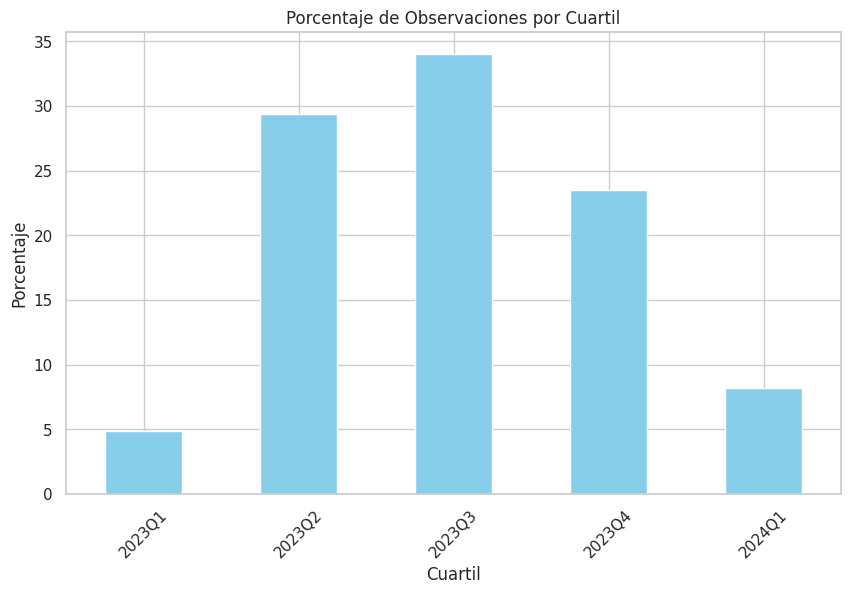

In [98]:
# 'first_ad_date' debe estar en formato de fecha
# Si 'first_ad_date' no está en formato datetime, primero:
df_work['first_ad_date'] = pd.to_datetime(df_work['first_ad_date'])
# Convertir 'time_on_market' de días a semanas y redondear
df_work['time_on_market'] = df_work['time_on_market'].div(7).add(1).apply(np.round)

# Extraer mes y cuartil (trimestre) de 'first_ad_date'
df_work['month'] = df_work['first_ad_date'].dt.month
df_work['quarter'] = df_work['first_ad_date'].dt.to_period('Q')

# Calcular número y porcentaje de observaciones por cuartil
observations_per_quarter = df_work.groupby('quarter').size()
percentages_per_quarter = observations_per_quarter / observations_per_quarter.sum() * 100

# Gráfico de barras para porcentaje de observaciones por cuartil
percentages_per_quarter.plot(kind='bar', figsize=(10, 6), color='skyblue')
plt.title('Porcentaje de Observaciones por Cuartil')
plt.xlabel('Cuartil')
plt.ylabel('Porcentaje')
plt.xticks(rotation=45)
plt.show()

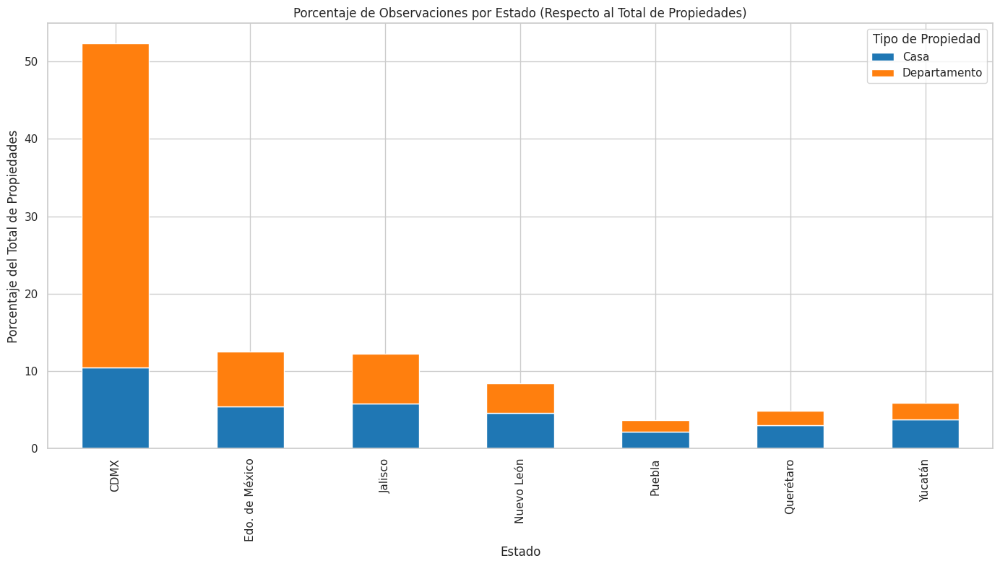

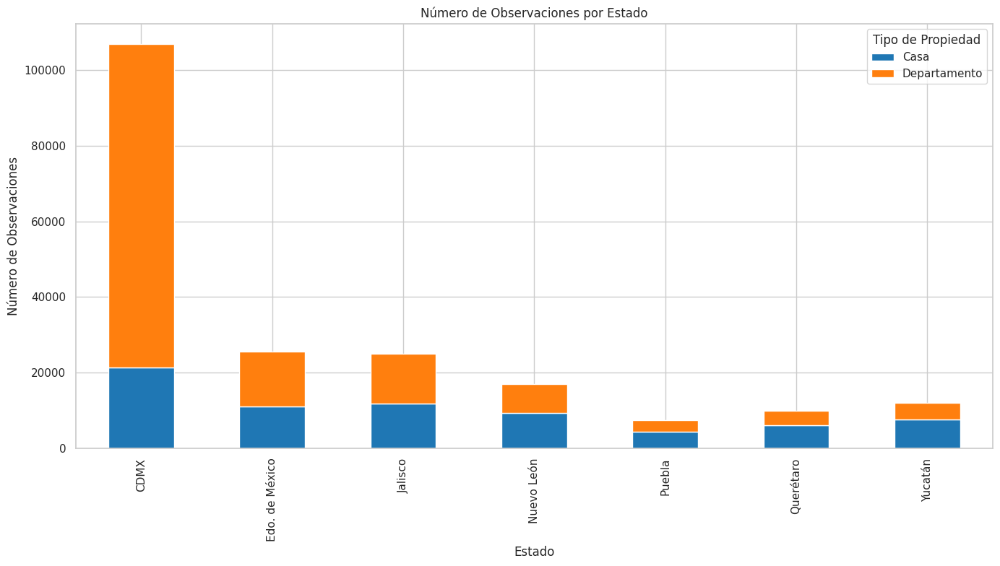

In [99]:
# Asumiendo que ya se hizo el mapeo de 'is_apartment' a 'property_type'
df_work['property_type'] = df_work['is_apartment'].map({0: 'Casa', 1: 'Departamento'})

# Agrupar por estado y tipo de propiedad, y contar las observaciones
state_property_counts = df_work.groupby(['ent_label', 'property_type']).size().unstack(fill_value=0)

# Calcular porcentajes respecto al total de propiedades, no solo por estado
total_counts = state_property_counts.sum().sum()  # Total de casas y departamentos
state_property_percentages = state_property_counts.div(total_counts) * 100  # Porcentajes respecto al total general

# Visualización con una paleta de colores diferente
state_property_percentages.plot(kind='bar', stacked=True, figsize=(14, 8), color=['#1f77b4', '#ff7f0e'])  # Azul y naranja
plt.title('Porcentaje de Observaciones por Estado (Respecto al Total de Propiedades)')
plt.xlabel('Estado')
plt.ylabel('Porcentaje del Total de Propiedades')
plt.legend(title='Tipo de Propiedad', labels=['Casa', 'Departamento'])
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Visualización del número de observaciones por estado y tipo de propiedad
state_property_counts.plot(kind='bar', stacked=True, figsize=(14, 8), color=['#1f77b4', '#ff7f0e'])  # Azul y naranja para casas y departamentos
plt.title('Número de Observaciones por Estado')
plt.xlabel('Estado')
plt.ylabel('Número de Observaciones')
plt.legend(title='Tipo de Propiedad', labels=['Casa', 'Departamento'])
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### 3. Distribución de Tiempos de Vida a Nivel Entidad Federativa

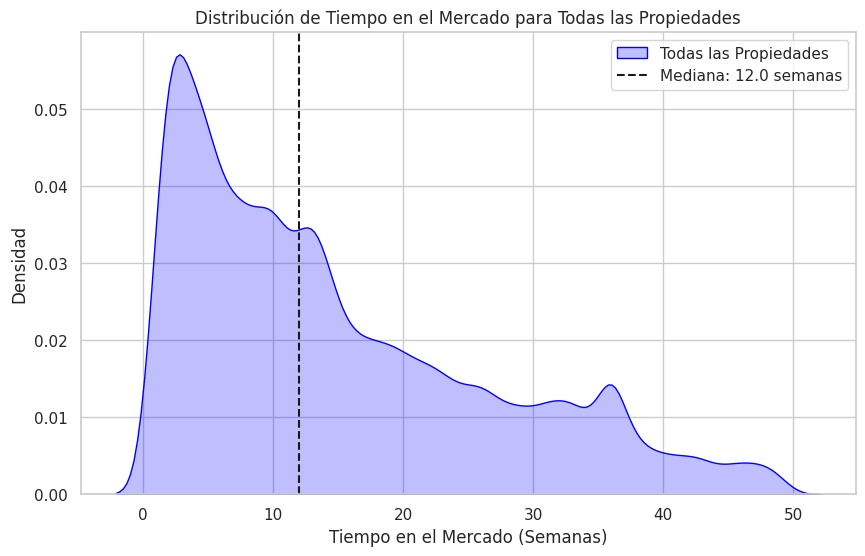

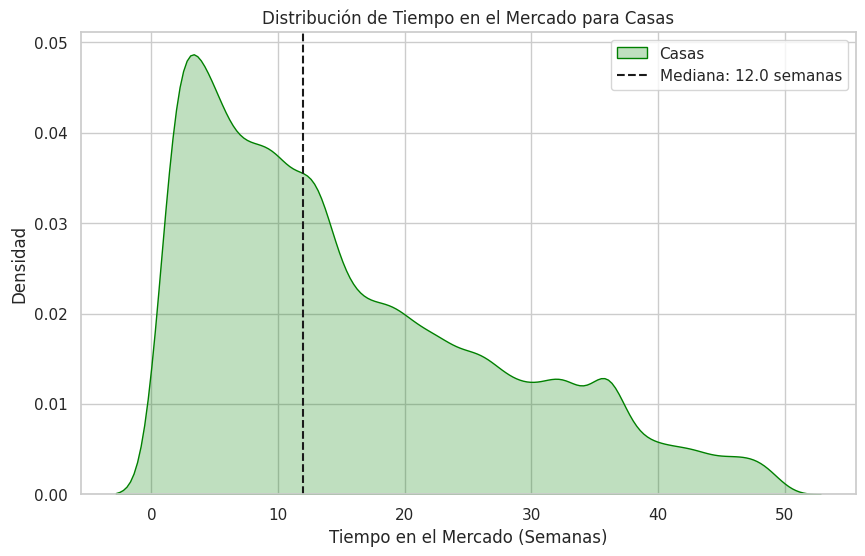

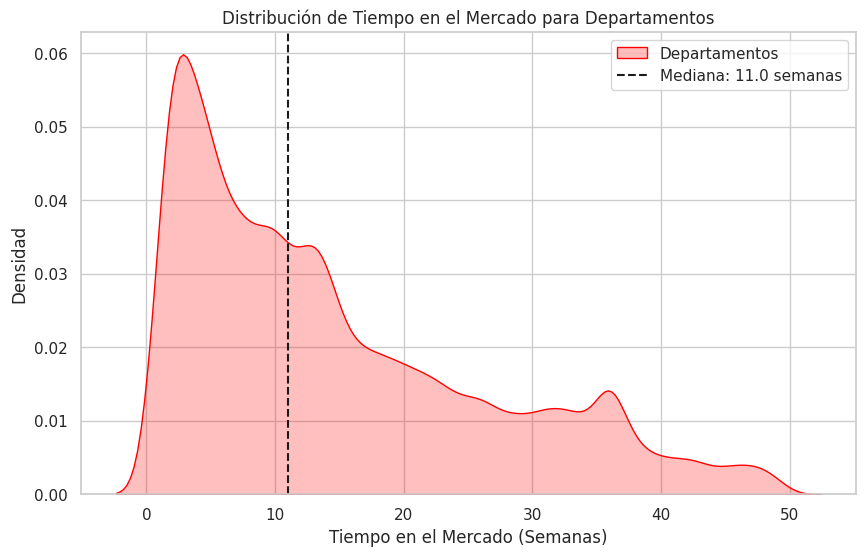

In [102]:
# Calcular medianas
mediana_total = df_work['time_on_market'].median()
mediana_casas = df_work[df_work['is_apartment'] == False]['time_on_market'].median()
mediana_departamentos = df_work[df_work['is_apartment'] == True]['time_on_market'].median()

# Gráfico de densidad para todas las propiedades
plt.figure(figsize=(10, 6))
sns.kdeplot(df_work['time_on_market'], fill=True, color='blue', label='Todas las Propiedades')
plt.axvline(mediana_total, color='k', linestyle='--', label=f'Mediana: {mediana_total} semanas')
plt.title('Distribución de Tiempo en el Mercado para Todas las Propiedades')
plt.xlabel('Tiempo en el Mercado (Semanas)')
plt.ylabel('Densidad')
plt.legend()
plt.show()

# Gráfico de densidad para casas
plt.figure(figsize=(10, 6))
sns.kdeplot(df_work[df_work['is_apartment'] == False]['time_on_market'], fill=True, color='green', label='Casas')
plt.axvline(mediana_casas, color='k', linestyle='--', label=f'Mediana: {mediana_casas} semanas')
plt.title('Distribución de Tiempo en el Mercado para Casas')
plt.xlabel('Tiempo en el Mercado (Semanas)')
plt.ylabel('Densidad')
plt.legend()
plt.show()

# Gráfico de densidad para departamentos
plt.figure(figsize=(10, 6))
sns.kdeplot(df_work[df_work['is_apartment'] == True]['time_on_market'], fill=True, color='red', label='Departamentos')
plt.axvline(mediana_departamentos, color='k', linestyle='--', label=f'Mediana: {mediana_departamentos} semanas')
plt.title('Distribución de Tiempo en el Mercado para Departamentos')
plt.xlabel('Tiempo en el Mercado (Semanas)')
plt.ylabel('Densidad')
plt.legend()
plt.show()

### 4.- Curvas de supervivencia

In [104]:
# create event variable
df_work['event'] = 1 - df_work['on_market_ds']

### 1. Todas las Casas vs. Todos los Departamentos

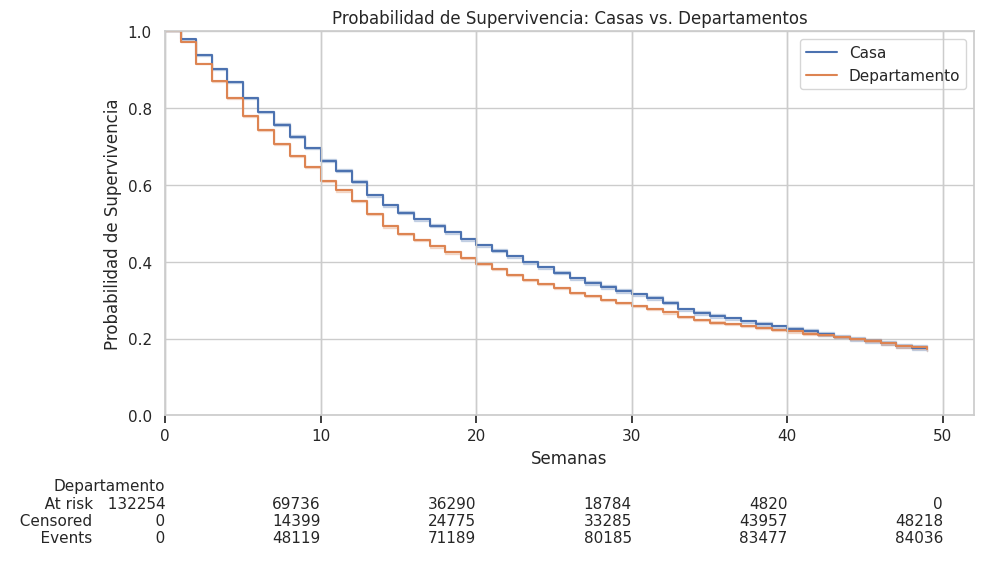

In [109]:
def plot_km_general(df):
    plt.figure(figsize=(10, 6))
    ax = plt.subplot(111)

    kmf = lifelines.KaplanMeierFitter()

    for is_apartment in df['is_apartment'].unique():
        subset = df[df['is_apartment'] == is_apartment]
        kmf.fit(subset['time_on_market'], subset['event'], label='Departamento' if is_apartment else 'Casa')
        kmf.plot_survival_function(ax=ax, ci_show=True)

    ax.set_xlabel('Semanas')
    ax.set_xlim(0, 52)
    ax.set_ylabel('Probabilidad de Supervivencia')
    ax.set_ylim(0, 1)
    plt.title('Probabilidad de Supervivencia: Casas vs. Departamentos')
    lifelines.plotting.add_at_risk_counts(kmf, ax=ax)
    plt.tight_layout()
    plt.show()

plot_km_general(df_work)

### 2. Curvas de Casas por Estado

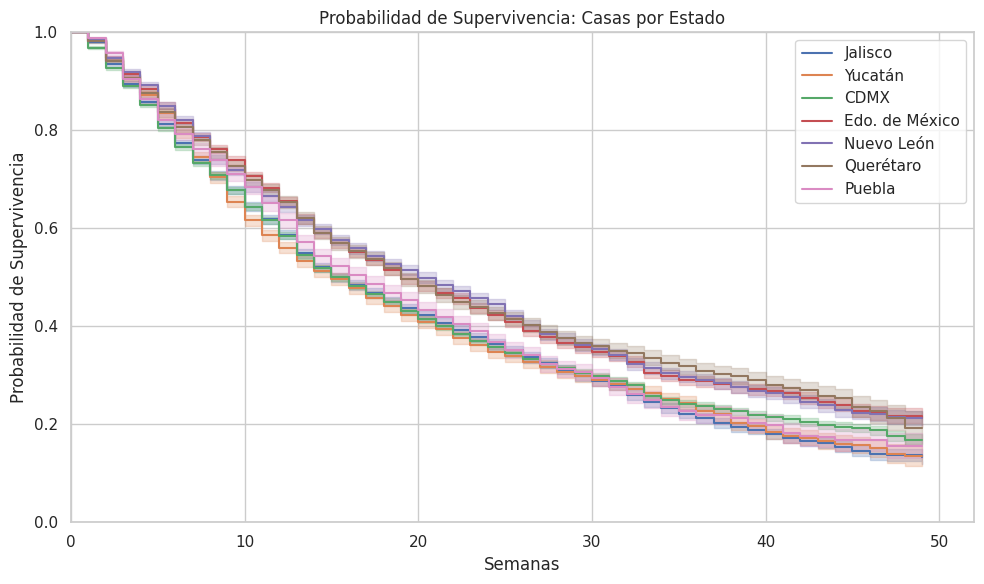

In [110]:
def plot_km_houses_by_state(df):
    plt.figure(figsize=(10, 6))
    ax = plt.subplot(111)

    df_houses = df[df['is_apartment'] == 0]
    states = df_houses['ent_label'].unique()

    for state in states:
        kmf = lifelines.KaplanMeierFitter()
        subset = df_houses[df_houses['ent_label'] == state]
        if not subset.empty:
            kmf.fit(subset['time_on_market'], subset['event'], label=state)
            kmf.plot_survival_function(ax=ax, ci_show=True)

    ax.set_xlabel('Semanas')
    ax.set_xlim(0, 52)
    ax.set_ylabel('Probabilidad de Supervivencia')
    ax.set_ylim(0, 1)
    plt.title('Probabilidad de Supervivencia: Casas por Estado')
    plt.tight_layout()
    plt.show()

plot_km_houses_by_state(df_work)


### 3. Curvas de Departamentos por Estado

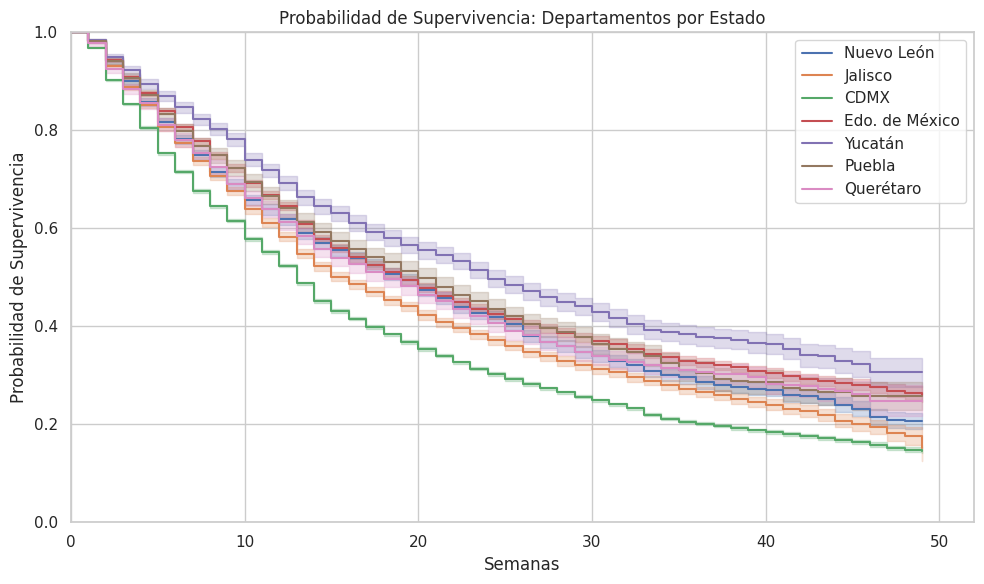

In [111]:
def plot_km_apartments_by_state(df):
    plt.figure(figsize=(10, 6))
    ax = plt.subplot(111)

    df_apartments = df[df['is_apartment'] == 1]
    states = df_apartments['ent_label'].unique()

    for state in states:
        kmf = lifelines.KaplanMeierFitter()
        subset = df_apartments[df_apartments['ent_label'] == state]
        if not subset.empty:
            kmf.fit(subset['time_on_market'], subset['event'], label=state)
            kmf.plot_survival_function(ax=ax, ci_show=True)

    ax.set_xlabel('Semanas')
    ax.set_xlim(0, 52)
    ax.set_ylabel('Probabilidad de Supervivencia')
    ax.set_ylim(0, 1)
    plt.title('Probabilidad de Supervivencia: Departamentos por Estado')
    plt.tight_layout()
    plt.show() # print

plot_km_apartments_by_state(df_work)

## Name variables

In [ ]:
print(df_work.columns.to_list())

['property_code', 'id', 'is_sale', 'is_apartment', 'on_market_ds', 'time_on_market', 'cve_ent', 'cve_mun', 'cve_loc', 'id_sepomex', 'built_year', 'first_ad_date', 'last_ad_date', 'first_scraper', 'first_seller', 'last_price', 'first_price', 'prediction_price_sale', 'prediction_price_rent', 'percentual_change_price_sale', 'percentual_change_price_rent', 'num_sellers', 'num_marketplaces', 'longitude', 'latitude', 'built_surface', 'total_surface', 'num_bedrooms', 'num_bathrooms', 'num_parking_lots', 'is_new_property_prob', 'is_condominium', 'is_development', 'is_presale', 'has_yard_or_garden', 'has_terrace_or_balcony', 'has_cellar', 'has_chimney', 'has_commercial_zone', 'has_elevator', 'has_game_courts', 'has_grill', 'has_gym', 'has_pool_or_jacuzzi', 'has_kids_playground', 'has_lobby', 'has_park_view', 'has_studio', 'has_surveillance', 'has_water_reserved_tank', 'has_comercial_land_use', 'has_cafeteria', 'is_penthouse', 'is_exterior', 'num_outdoor_spaces', 'num_common_spaces', 'ad_count',

# EDA Time on Market (y & $\delta$)

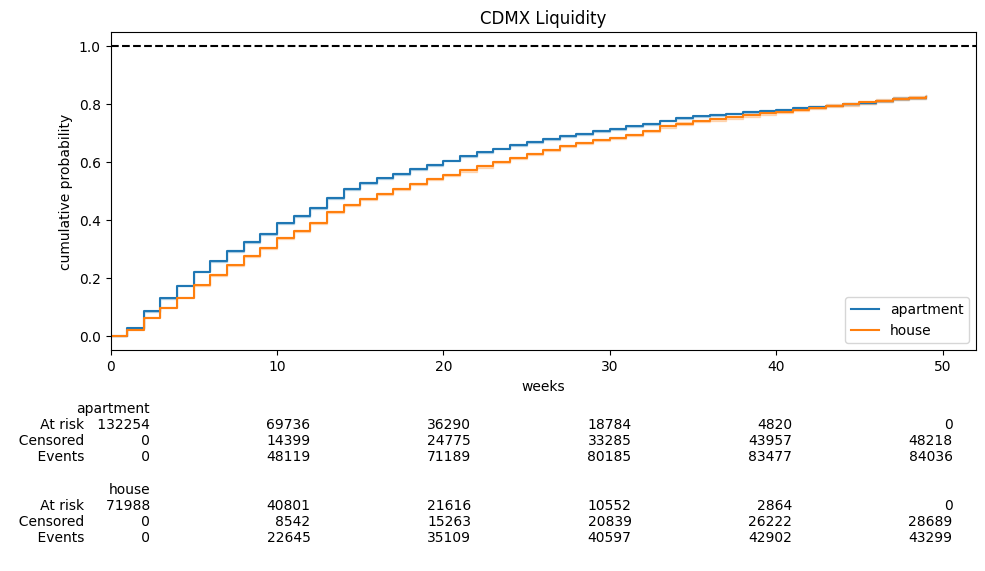

In [ ]:
## General KM
# pass time_on_market to weeks
df_work['time_on_market'] = df_work['time_on_market'].div(7).add(1).apply(np.round)

# create event variable
df_work['event'] = 1 - df_work['on_market_ds']
# plot survival curves by property_type, listing_type
def plot_km(df):
    # create figure
    ax = plt.subplot(111)

    # property type for rent
    kmf_rent = lifelines.KaplanMeierFitter()
    df_apartment = df[df['is_apartment'] == 1].copy()
    ax = kmf_rent.fit(
        df_apartment['time_on_market'],
        df_apartment['event'],
        label='apartment'
    ).plot_cumulative_density(
        ci_show=True,
        figsize=(10, 6),
        title='CDMX Liquidity'
    )

    # property type for sale
    kmf_sell = lifelines.KaplanMeierFitter()
    df_house = df[df['is_apartment'] == 0].copy()
    ax = kmf_sell.fit(
        df_house['time_on_market'],
        df_house['event'],
        label='house'
    ).plot_cumulative_density(
        ci_show=True,
        ax=ax,
    )

    # add risk counts
    lifelines.plotting.add_at_risk_counts(kmf_rent, kmf_sell, ax=ax)
    # x axis as weeks
    ax.set_xlabel('weeks')
    # limit to 52 weeks
    ax.set_xlim(0, 52)
    # y axis a survival probability
    ax.set_ylabel('cumulative probability')
    # add hline in 1 as a dashed line
    ax.axhline(1, ls='--', color='black')
    plt.tight_layout()
    plt.show()
    return

# plot survival curves by property_type
plot_km(df_work)

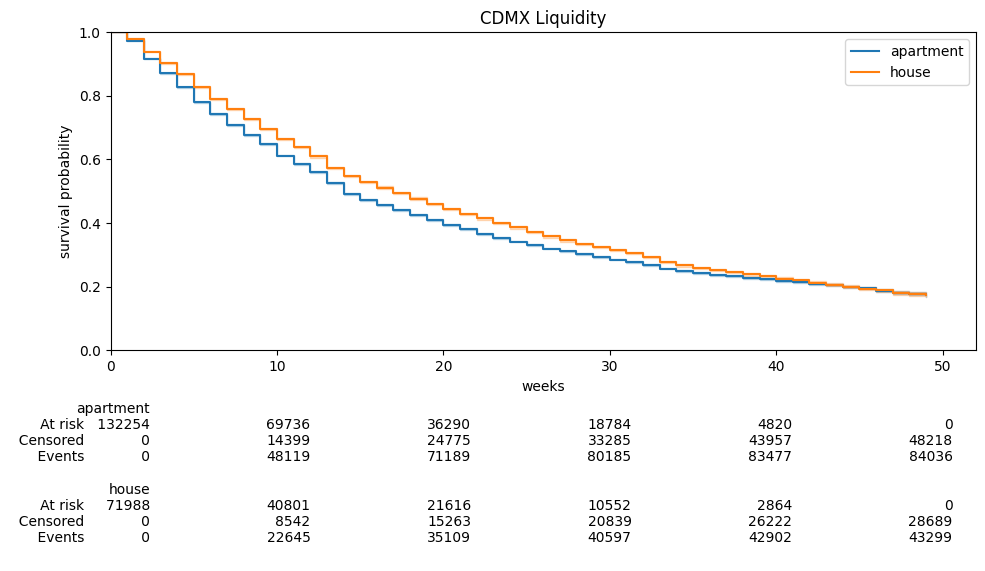

In [ ]:
# plot survival curves by property_type, listing_type
def plot_km(df):
    # create figure
    ax = plt.subplot(111)

    # property type for rent
    kmf_rent = lifelines.KaplanMeierFitter()
    df_apartment = df[df['is_apartment'] == 1].copy()
    ax = kmf_rent.fit(
        df_apartment['time_on_market'],
        df_apartment['event'],
        label='apartment'
    ).plot_survival_function(
        ci_show=True,
        figsize=(10, 6),
        title='CDMX Liquidity'
    )

    # property type for sale
    kmf_sell = lifelines.KaplanMeierFitter()
    df_house = df[df['is_apartment'] == 0].copy()
    ax = kmf_sell.fit(
        df_house['time_on_market'],
        df_house['event'],
        label='house'
    ).plot_survival_function(
        ci_show=True,
        ax=ax,
    )

    # add risk counts
    lifelines.plotting.add_at_risk_counts(kmf_rent, kmf_sell, ax=ax)
    # x axis as weeks
    ax.set_xlabel('weeks')
    # limit to 52 weeks
    ax.set_xlim(0, 52)
    # y axis a survival probability
    ax.set_ylabel('survival probability')
    ax.set_ylim(0, 1)
    plt.tight_layout()
    plt.show()
    return

# plot survival curves by property_type
plot_km(df_work)

In [ ]:
# get median time on market using Kaplan Meier
def get_median_time_on_market(df):
    # property type for rent
    kmf_rent = lifelines.KaplanMeierFitter()
    df_apartment = df[df['is_apartment'] == 1].copy()
    kmf_rent.fit(
        df_apartment['time_on_market'],
        df_apartment['event'],
    )
    median_rent = kmf_rent.median_survival_time_

    # property type for sale
    kmf_sell = lifelines.KaplanMeierFitter()
    df_house = df[df['is_apartment'] == 0].copy()
    kmf_sell.fit(
        df_house['time_on_market'],
        df_house['event'],
    )
    median_sell = kmf_sell.median_survival_time_
    return median_rent, median_sell

# get median time on market
get_median_time_on_market(df_work)

(14.0, 17.0)

In [ ]:
# get censoring rate by property_type
(
    df_work
    .groupby("is_apartment")
    .agg({"on_market_ds": "mean"})
    .rename(columns={"event": "censoring_rate"})
    .round(4)
)

,on_market_ds
is_apartment,
0,0.3985
1,0.3646


In [ ]:
# get censoring rate by property_type
df_work['on_market_ds'].mean().round(4)

0.3765

# X's

## Univariate

### WOE

In [ ]:
# read woes
dir = "../../data/woe_bins"
files = os.listdir(dir)
# only for_sale
files = [f for f in files if ("for_sale" in f and ".csv" in f)]
# read woes csv in a dict
bins = {re.sub(r"\.csv|for_sale_|_20240202", "", f): pd.read_csv(f"{dir}/{f}") for f in files}
# add group column
for k, v in bins.items():
    # row number
    v['group'] = "group_" + v.index.astype(str)

# look bins
bins.keys()

FileNotFoundError: [Errno 2] No such file or directory: '../../data/woe_bins'

In [ ]:
# look scraper
bins['first_scraper']

,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values,group
0,first_scraper,"loft%,%flat%,%easybroker%,%beleta",47426,0.363769,25437,21989,0.463649,-0.345816,0.043822,0.09792,"loft%,%flat%,%easybroker%,%beleta",False,group_0
1,first_scraper,inmuebles24,50996,0.391152,22486,28510,0.559063,0.037209,0.000540,0.09792,inmuebles24,False,group_1
2,first_scraper,"metros_cubicos%,%viva_anuncios%,%nolab%,%la_haus",31952,0.245080,10762,21190,0.663182,0.477355,0.053558,0.09792,"metros_cubicos%,%viva_anuncios%,%nolab%,%la_haus",False,group_2


In [ ]:
# look id_sepomex
bins['id_sepomex']

,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values,group
0,id_sepomex,others,8683,0.066601,3360,5323,0.613037,0.259943,0.004418,0.149483,others,True,group_0
1,id_sepomex,"12956.0%,%40038.0%,%24582.0%,%43183.0%,%43062....",6519,0.050002,4295,2224,0.341157,-0.858297,0.036190,0.149483,"12956.0%,%40038.0%,%24582.0%,%43183.0%,%43062....",False,group_1
2,id_sepomex,"35399.0%,%36062.0%,%35570.0%,%35419.0%,%40219....",12720,0.097565,7247,5473,0.430267,-0.480914,0.022673,0.149483,"35399.0%,%36062.0%,%35570.0%,%35419.0%,%40219....",False,group_2
3,id_sepomex,"25974.0%,%11765.0%,%11352.0%,%57062.0%,%40949....",50151,0.384670,24760,25391,0.506291,-0.174988,0.011852,0.149483,"25974.0%,%11765.0%,%11352.0%,%57062.0%,%40949....",False,group_3
4,id_sepomex,"34047.0%,%12500.0%,%11634.0%,%11816.0%,%24041....",42004,0.322181,16419,25585,0.609109,0.243414,0.018769,0.149483,"34047.0%,%12500.0%,%11634.0%,%11816.0%,%24041....",False,group_4
5,id_sepomex,"56594.0%,%11463.0%,%11283.0%,%12463.0%,%24469....",10297,0.078980,2604,7693,0.747111,0.883109,0.055581,0.149483,"56594.0%,%11463.0%,%11283.0%,%12463.0%,%24469....",False,group_5


In [ ]:
# look first_seller
bins['first_seller']

,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values,group
0,first_seller,others,32342,0.248071,13788,18554,0.573681,0.096734,0.002308,0.719253,others,True,group_0
1,first_seller,no_seller,6906,0.052971,1615,5291,0.766145,0.986519,0.045661,0.719253,no_seller,True,group_1
2,first_seller,"ROMUN INMUEBLES%,%Grupo Inmobiliario Riuz%,%AB...",6538,0.050148,5706,832,0.127256,-2.125594,0.182005,0.719253,"ROMUN INMUEBLES%,%Grupo Inmobiliario Riuz%,%AB...",False,group_2
3,first_seller,"Inmobiliaria SANTA ANITA%,%Merary De Haro%,%LB...",10929,0.083828,7951,2978,0.272486,-1.182199,0.111062,0.719253,"Inmobiliaria SANTA ANITA%,%Merary De Haro%,%LB...",False,group_3
4,first_seller,"IN PROPERTIES ASESORES INMOBILIARIOS%,%INMOBIL...",43121,0.330748,23010,20111,0.466385,-0.334815,0.037353,0.719253,"IN PROPERTIES ASESORES INMOBILIARIOS%,%INMOBIL...",False,group_4
5,first_seller,"Century 21 Acierto (C21)%,%Dicon Inmobiliaria%...",23753,0.182191,6266,17487,0.736202,0.826166,0.113313,0.719253,"Century 21 Acierto (C21)%,%Dicon Inmobiliaria%...",False,group_5
6,first_seller,"Tudepartamento Com%,%Inmobiliaria de Yazmin A...",6785,0.052043,349,6436,0.948563,2.714437,0.227550,0.719253,"Tudepartamento Com%,%Inmobiliaria de Yazmin A...",False,group_6


/var/folders/42/2lkg1sf91wv7mjxw6klfcqtc0000gn/T/ipykernel_46074/3651869451.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


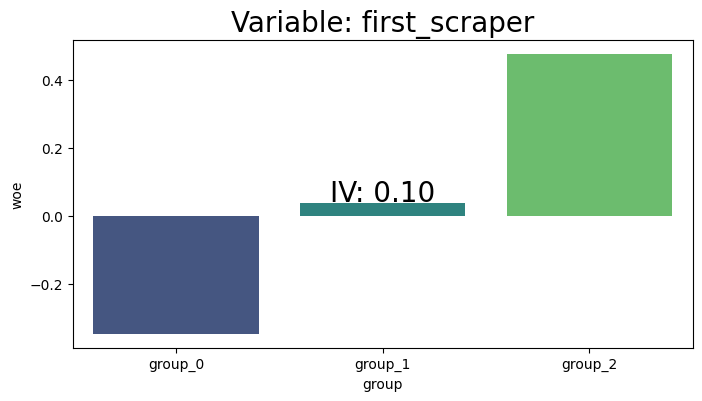

/var/folders/42/2lkg1sf91wv7mjxw6klfcqtc0000gn/T/ipykernel_46074/3651869451.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


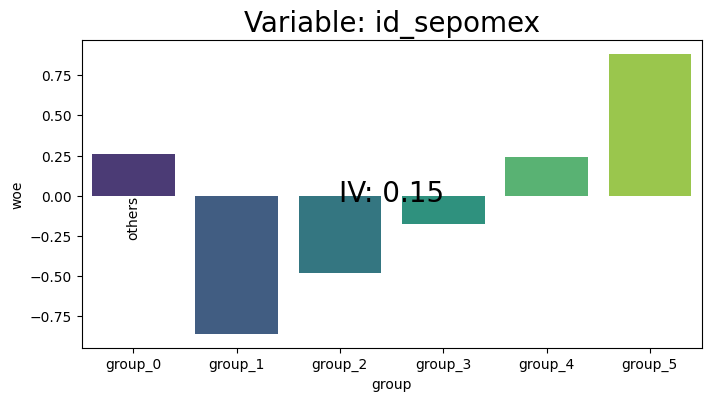

/var/folders/42/2lkg1sf91wv7mjxw6klfcqtc0000gn/T/ipykernel_46074/3651869451.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


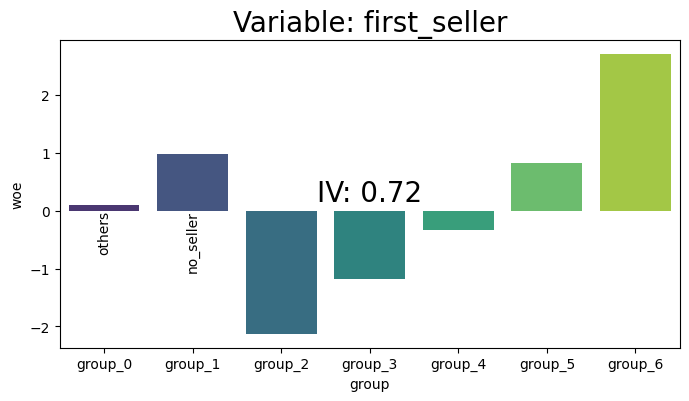

In [ ]:
# colplot for group / woe, with annotation of total_iv
for k, df in bins.items():
    # seaborn plot
    fig, ax = plt.subplots(figsize=(8, 4))

    # plot
    sns.barplot(
        x='group',
        y='woe',
        data=df,
        ax=ax,
        # viridis palette
        palette='viridis'
    )

    # annotate df['total_iv'].iloc[0] as information value
    ax.annotate(
        f"IV: {df['total_iv'].iloc[0]:.2f}",
        xy=(0.5, 0.5),
        xycoords='axes fraction',
        # ha at left
        ha='center',
        # va at top
        va='center',
        fontsize=20
    )

    # change x tick if the row 'is_special_values' is True
    for index, row in df.iterrows():
        if row['is_special_values'] == True:
            ax.text(
                index,
                0,
                row['bin'],
                rotation=90,
                ha='center',
                va='top',
                fontsize=10
            )

    # set title
    ax.set_title(f"Variable: {k}", fontsize=20)

    # show
    plt.show()

/var/folders/42/2lkg1sf91wv7mjxw6klfcqtc0000gn/T/ipykernel_46074/46743881.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


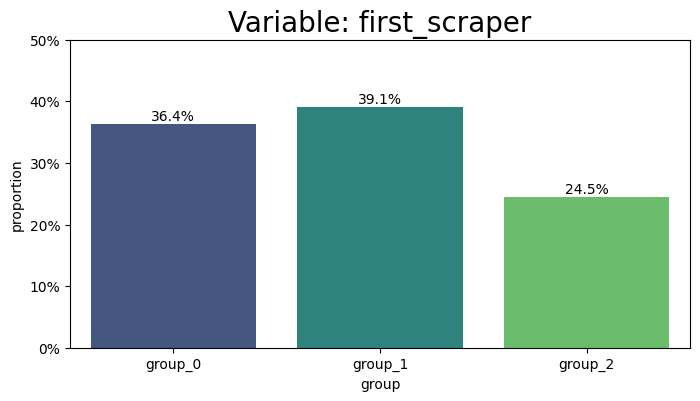

/var/folders/42/2lkg1sf91wv7mjxw6klfcqtc0000gn/T/ipykernel_46074/46743881.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


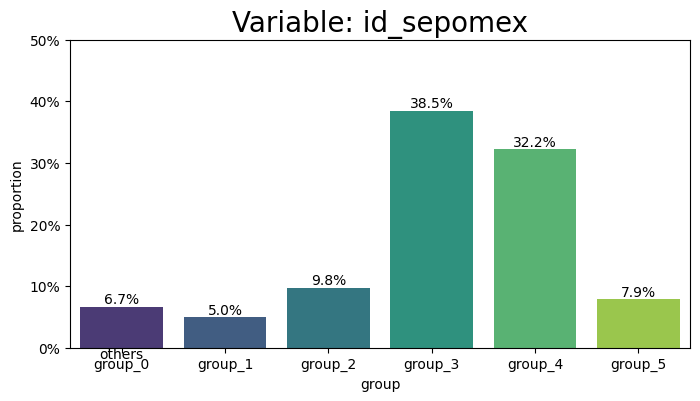

/var/folders/42/2lkg1sf91wv7mjxw6klfcqtc0000gn/T/ipykernel_46074/46743881.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


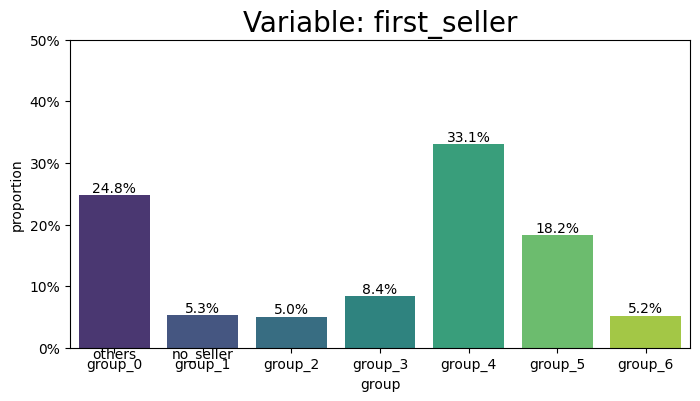

In [ ]:
# get percentage of each group
for k, df in bins.items():
    # seaborn plot
    fig, ax = plt.subplots(figsize=(8, 4))

    # plot
    sns.barplot(
        x='group',
        y='count_distr',
        data=df,
        ax=ax,
        # viridis palette
        palette='viridis'
    )

    # change x tick if the row 'is_special_values' is True
    for index, row in df.iterrows():
        if row['is_special_values'] == True:
            ax.text(
                index,
                0,
                row['bin'],
                ha='center',
                va='top',
                fontsize=10
            )

    # add percentage as text
    for index, row in df.iterrows():
        ax.text(
            index,
            row['count_distr'],
            f"{row['count_distr']:.1%}",
            ha='center',
            va='bottom',
            fontsize=10
        )

    # set title
    ax.set_title(f"Variable: {k}", fontsize=20)

    # y axis as percentage
    ax.set_ylabel('proportion')
    # y ticks as percentage
    ax.yaxis.set_major_formatter(
        plt.FuncFormatter(lambda x, _: f'{x:.0%}')
    )
    # y limit from 0 to 0.5
    ax.set_ylim(0, 0.5)

    # show
    plt.show()

### Categorical

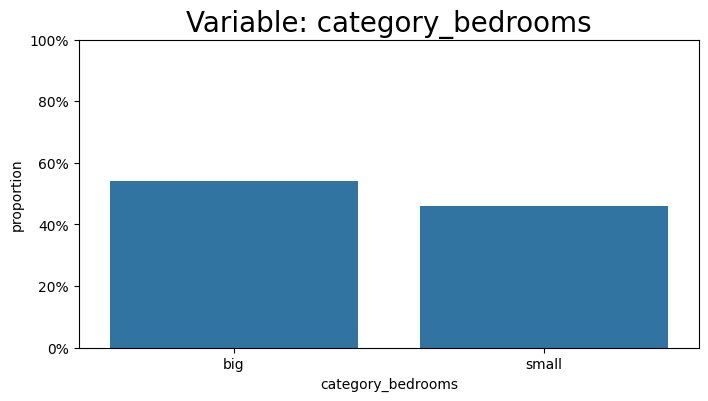

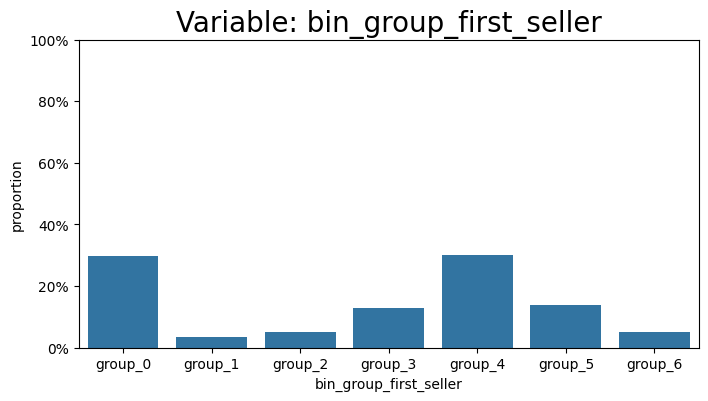

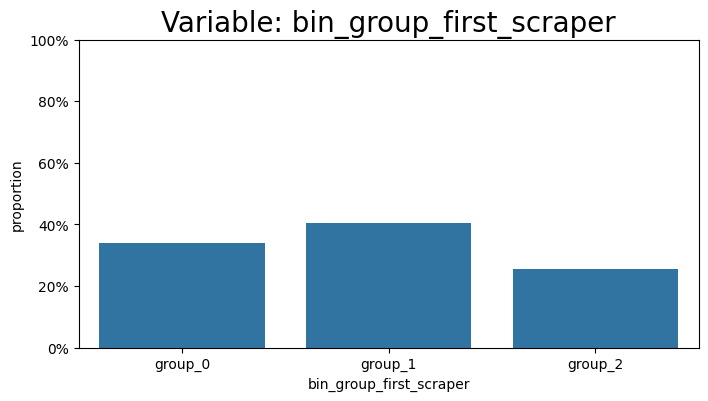

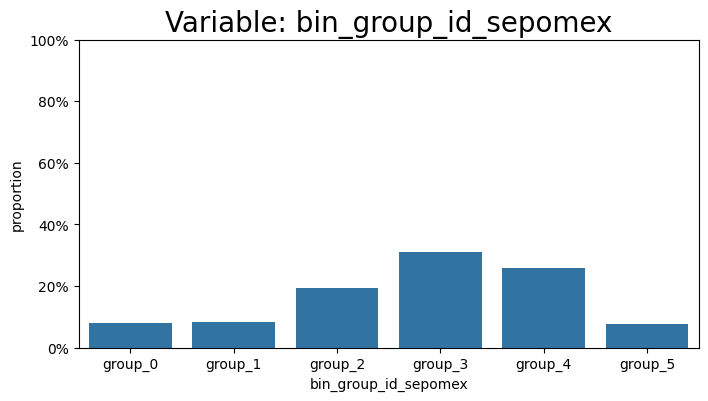

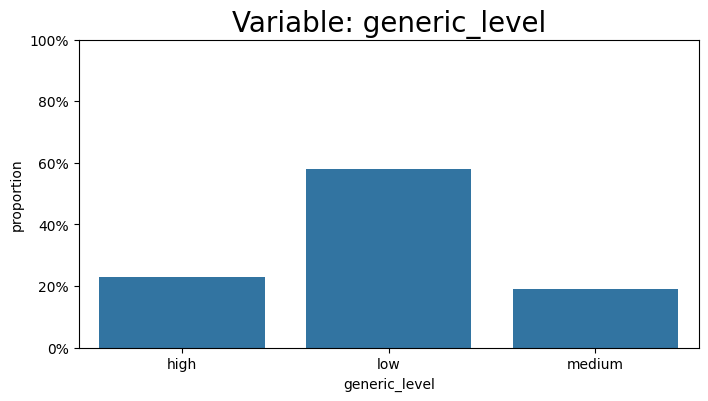

...

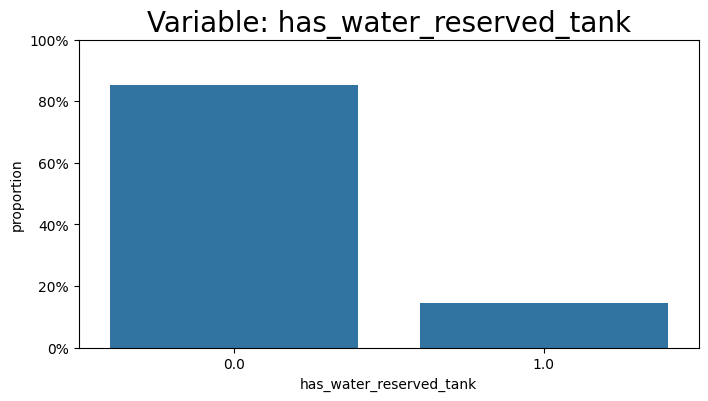

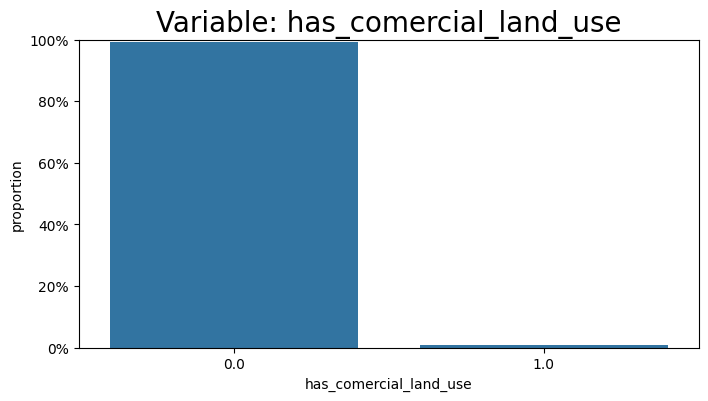

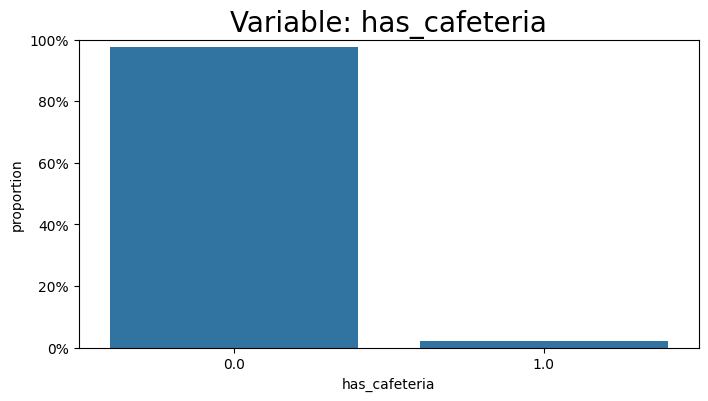

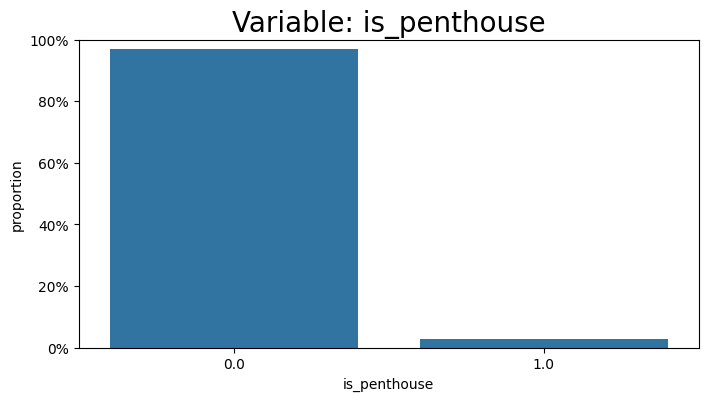

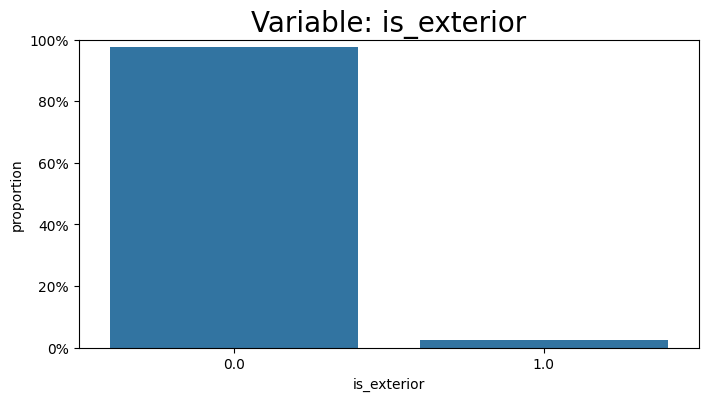

In [ ]:
# get categorical columns
cols_with_has_or_is = [
    col for col in df_work.columns.to_list() if col.startswith('has_') or col.startswith('is_')
]

# pop 'is_new_property_prob'
cols_with_has_or_is.remove('is_new_property_prob')

# categorical columns
cols_categorical = ['category_bedrooms', 'bin_group_first_seller', 'bin_group_first_scraper', 'bin_group_id_sepomex', 'generic_level'] + cols_with_has_or_is


# create a colplot function
def plot_bar(df, xvar):
    # seaborn plot
    fig, ax = plt.subplots(figsize=(8, 4))

    dfplot = df[xvar].value_counts(normalize=True).rename('percent').reset_index().sort_values(xvar)
    # plot percentage count in barplot
    sns.barplot(
        x=xvar,
        y='percent',
        data=dfplot,
        ax=ax
    )

    # set title
    ax.set_title(f"Variable: {xvar}", fontsize=20)

    # y axis as percentage
    ax.set_ylabel('proportion')
    # y ticks as percentage
    ax.yaxis.set_major_formatter(
        plt.FuncFormatter(lambda x, _: f'{x:.0%}')
    )
    # y limit from 0 to 0.5
    ax.set_ylim(0, 1)

    plt.show()
    return

for col in cols_categorical:
    plot_bar(df_work, col)

### Numerical

In [ ]:
# numerical cols
cols_numeric = [
    "built_year", "first_price", "prediction_price_sale", "percentual_change_price_sale", "percentual_change_price_rent",
    "built_surface", "total_surface", "num_bedrooms", "num_bathrooms", "num_parking_lots",
    "is_new_property_prob", "num_outdoor_spaces", "num_common_spaces", "luxury_score_bathrooms",
    "num_comps", "theoretical_percentile", "num_comps_adj_comps", "theoretical_percentile_adj_comps",
    "num_comps_sepomex_comps", "theoretical_percentile_sepomex_comps", "num_comps_mun_comps",
    "theoretical_percentile_mun_comps", "num_distinct_sellers_first_week", "num_distinct_marketplaces_first_week", "num_ads_first_week", "differentiation_points",
    "median_time_on_market_sepomex", "median_time_on_market_sepomex_apartment", "median_time_on_market_sepomex_apartment_bedrooms", "woe_first_seller", "woe_first_scraper", "woe_id_sepomex"
]


# get a describe
df_work[cols_numeric].describe().round(2)

,built_year,first_price,prediction_price_sale,percentual_change_price_sale,percentual_change_price_rent,built_surface,total_surface,num_bedrooms,num_bathrooms,num_parking_lots,...,num_distinct_sellers_first_week,num_distinct_marketplaces_first_week,num_ads_first_week,differentiation_points,median_time_on_market_sepomex,median_time_on_market_sepomex_apartment,median_time_on_market_sepomex_apartment_bedrooms,woe_first_seller,woe_first_scraper,woe_id_sepomex
count,204242.00,204242.00,204242.00,204242.00,204242.00,204242.00,204242.00,204242.00,204242.00,204242.00,...,204242.00,204242.00,204242.00,204242.00,202186.0,202186.0,202186.0,204242.00,204242.00,204242.00
mean,2010.77,5033877.85,7087545.82,-0.34,147.81,168.63,203.21,2.61,2.39,1.97,...,1.08,1.25,1.43,2.45,inf,inf,inf,0.07,0.01,0.03
std,13.38,6611318.47,6129912.94,0.51,118.67,129.61,172.04,0.92,1.11,1.19,...,0.43,0.54,0.93,0.00,NaN,NaN,NaN,0.88,0.29,0.46
min,1860.00,3000.00,560056.69,-1.00,-0.96,11.00,26.00,1.00,1.00,0.00,...,0.00,1.00,1.00,2.45,2.0,1.0,1.0,-2.13,-0.35,-0.86
25%,2005.00,30000.00,3189311.52,-0.99,0.14,80.00,84.00,2.00,2.00,1.00,...,1.00,1.00,1.00,2.45,68.0,68.0,67.0,-0.33,-0.24,-0.20
50%,2014.20,3200000.00,5073966.74,-0.10,191.31,125.00,142.00,3.00,2.00,2.00,...,1.00,1.00,1.00,2.45,122.0,122.0,118.0,0.05,0.04,-0.17
75%,2021.40,6950000.00,8662965.54,0.08,242.66,212.00,260.00,3.00,3.00,2.00,...,1.00,1.00,2.00,2.45,161.0,157.0,159.0,0.32,0.34,0.24
max,2026.00,50000000.00,84400961.44,0.40,618.86,1000.00,1000.00,6.00,6.00,10.00,...,16.00,5.00,29.00,2.45,inf,inf,inf,2.71,0.48,1.35


In [ ]:
df_work['num_comps'].le(0).mean()

0.11637175507486218

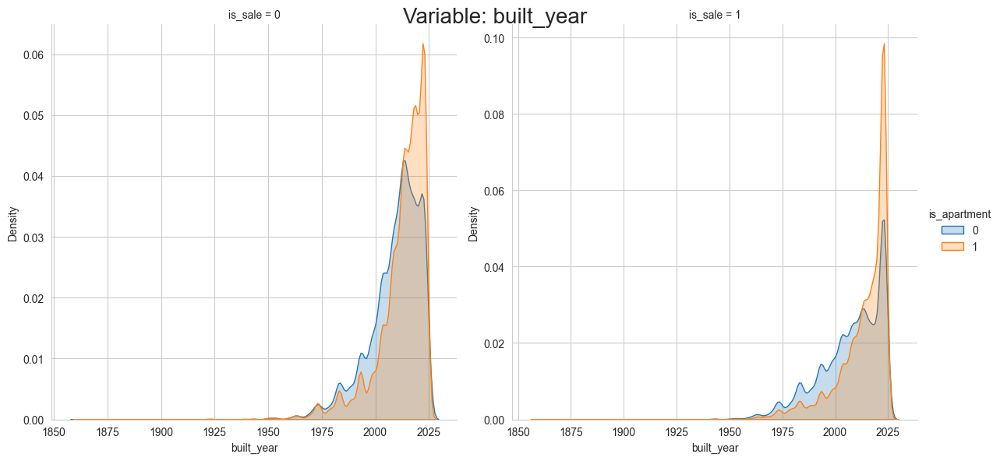

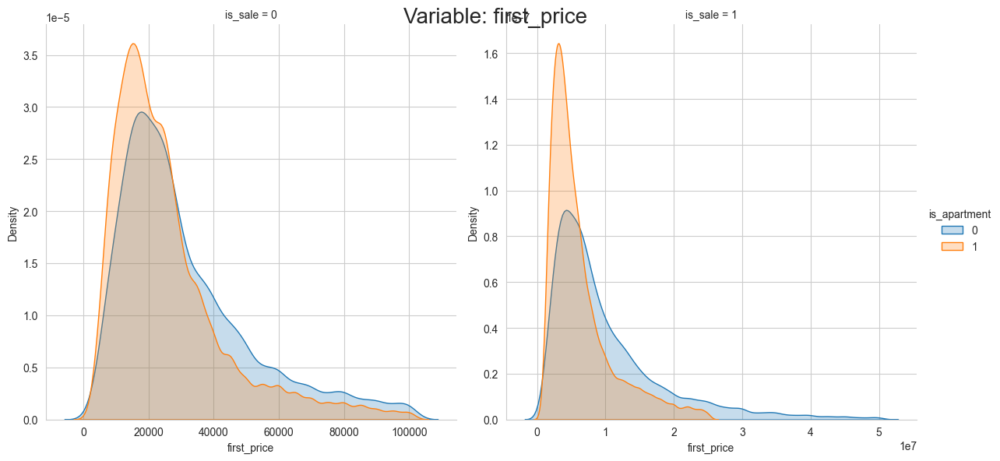

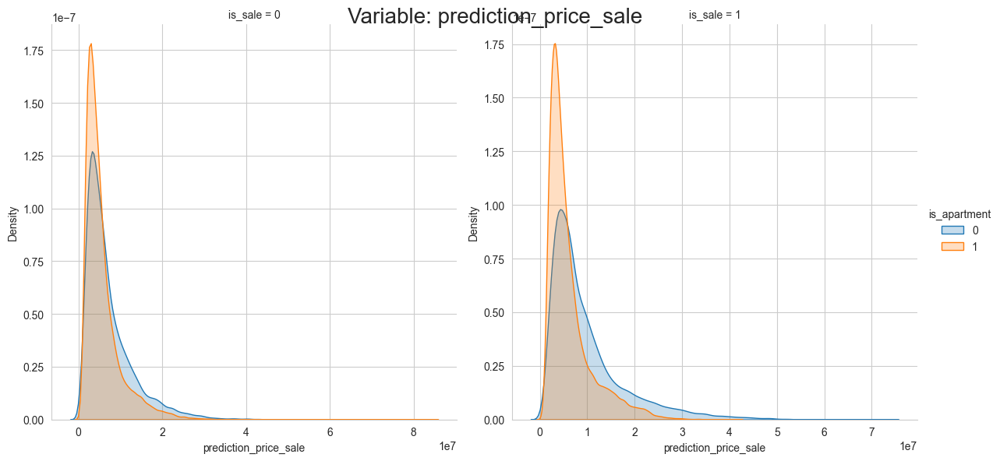

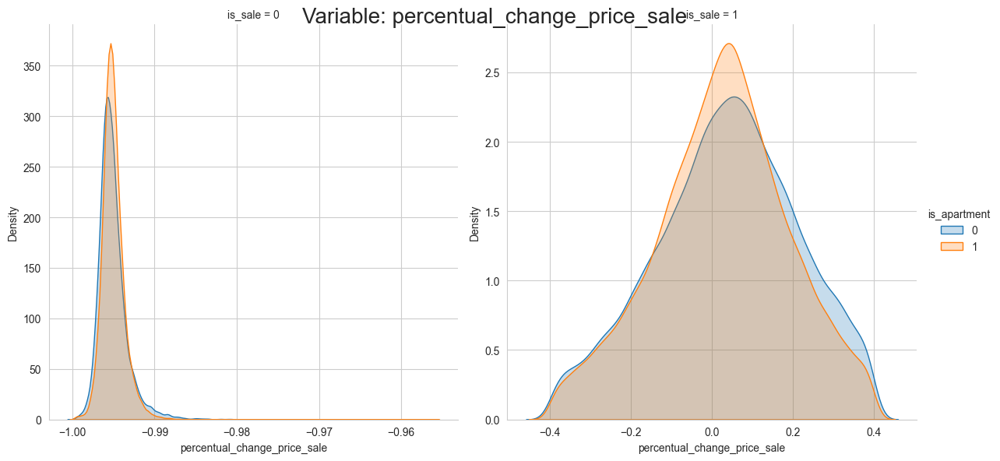

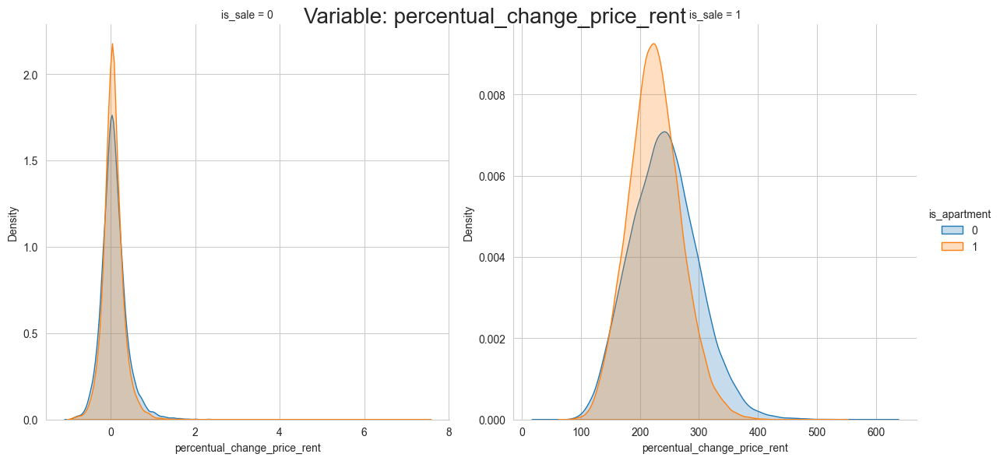

...

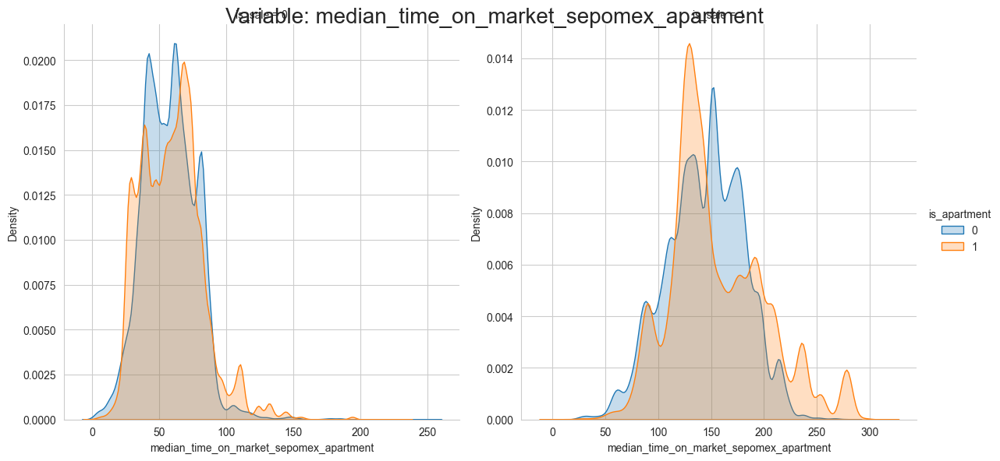

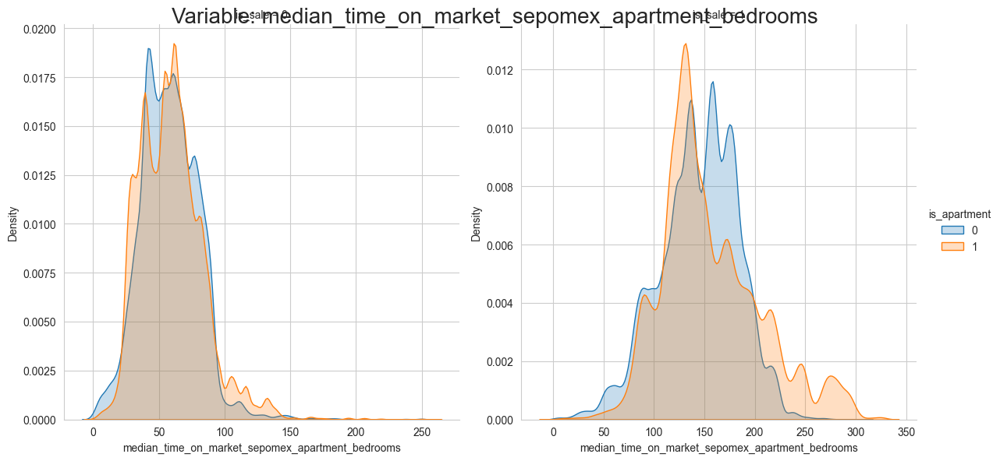

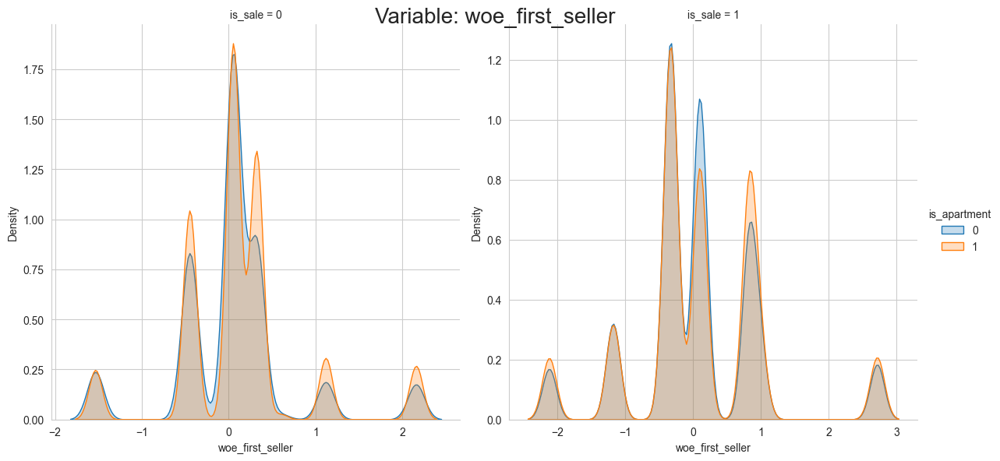

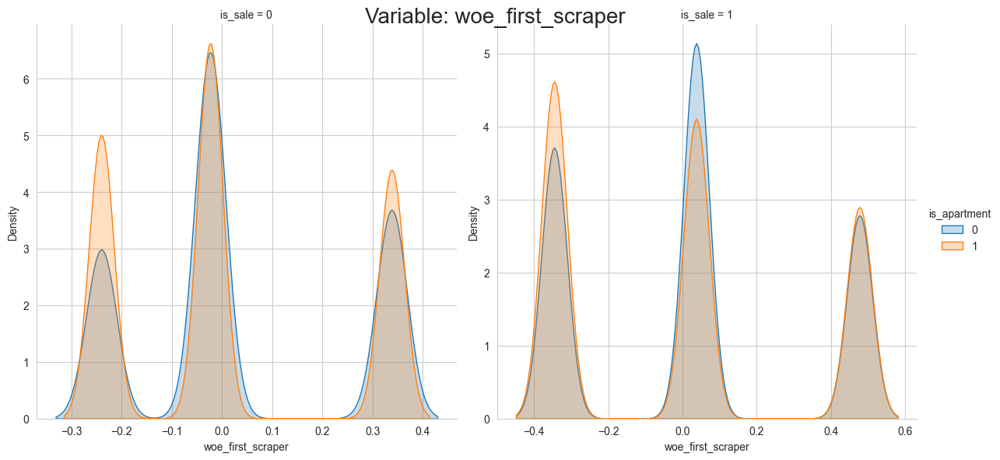

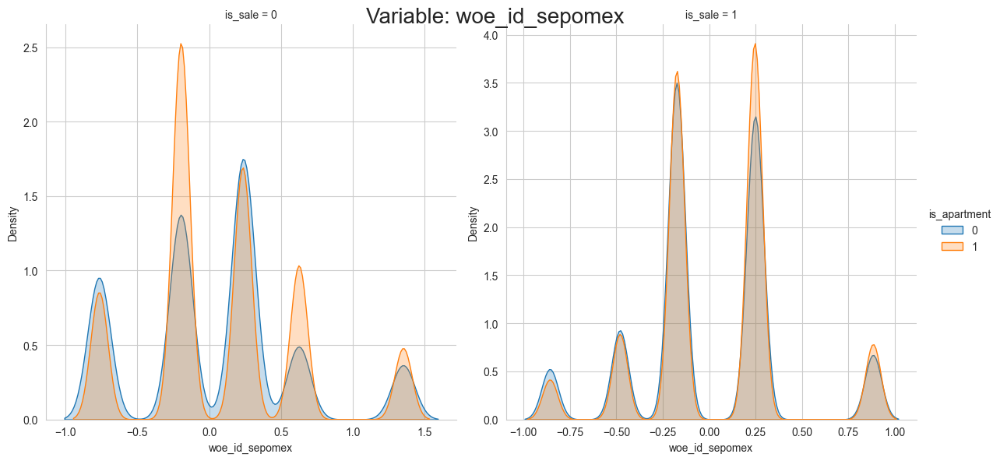

In [ ]:
# plot distribution
def plot_kde(df, xvar, log_scale=False):
    sns.set_style('whitegrid')
    # facet grid by is_sale and hue by is_apartment not same scale
    g = sns.FacetGrid(df, col='is_sale', hue='is_apartment', height=6, sharey=False, sharex=False)
    g.map(sns.kdeplot, xvar, log_scale=log_scale, fill=True)

    # set title
    g.fig.suptitle(f"Variable: {xvar}", fontsize=20)

    # show legend
    g.add_legend()

    # show
    plt.show()
    return

for col in cols_numeric:
    plot_kde(df_work, col)

Notes:

- there are some properties beyond 2024 (current year)
- is new property prob us very different between apartment and house

## Correlations

### WOE

In [ ]:
# woe binning corr
df_work[[col for col in df_work.columns if col.startswith('woe')]].corr(method='kendall')

,woe_first_seller,woe_id_sepomex,woe_first_scraper
woe_first_seller,1.000000,0.111866,0.112914
woe_id_sepomex,0.111866,1.000000,0.091926
woe_first_scraper,0.112914,0.091926,1.000000


### Numeric

FileNotFoundError: [Errno 2] No such file or directory: '../../../figures/sale_corr_matrix.png'

<Figure size 3000x3000 with 0 Axes>

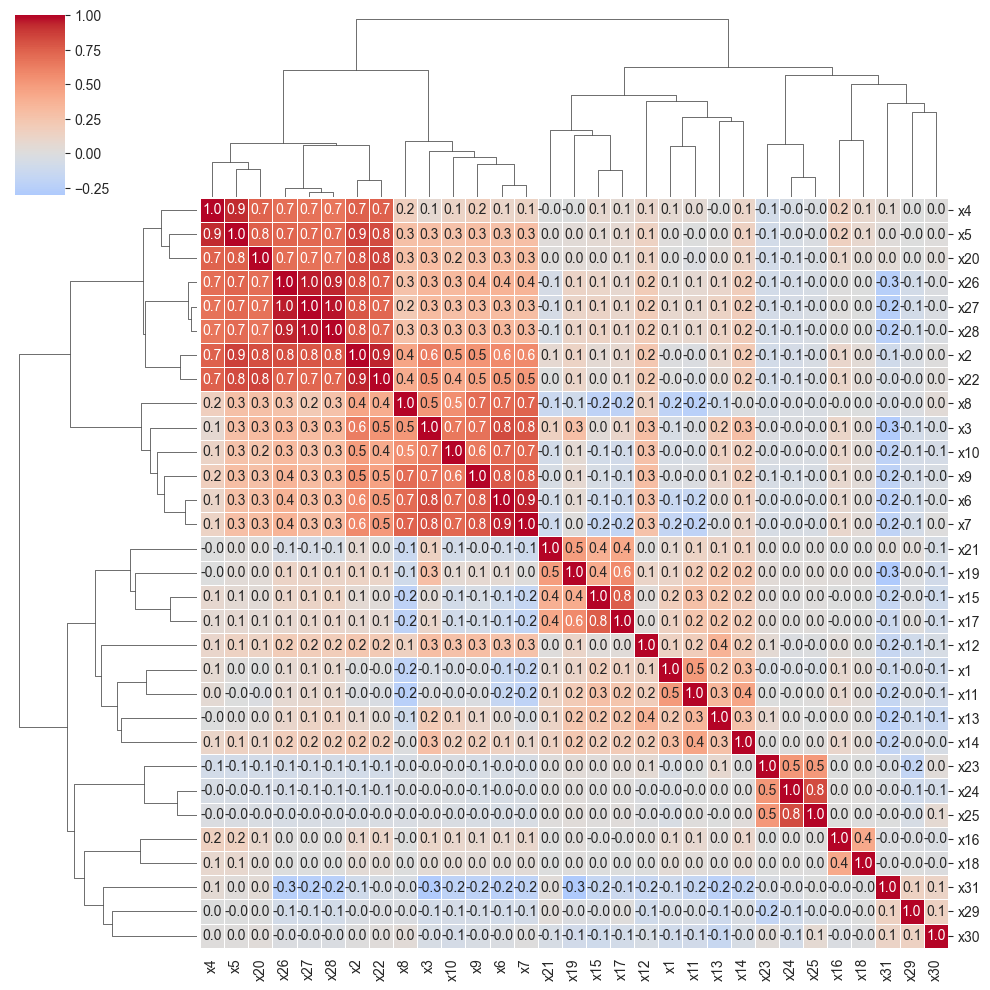

In [ ]:
# get second half of the matrix
# delete inf values
cols_numeric = [col for col in cols_numeric if col not in ['differentiation_points']]
corr_matrix = df_work[cols_numeric].replace([np.inf, -np.inf], np.nan).corr(method='spearman')

# change names of cols and index as xi
corr_matrix.columns = [f"x{i}" for i in range(1, len(corr_matrix.columns) + 1)]
corr_matrix.index = [f"x{i}" for i in range(1, len(corr_matrix.index) + 1)]

# corr_matrix
# Create a clustermap with one number annotation
plt.figure(figsize=(30, 30))
# cmap as coolwarm but from 1 to -1, but invert the colors
sns.clustermap(
    corr_matrix,
    cmap='coolwarm',
    center=0,
    annot=True,
    fmt=".1f",
    linewidths=.5
)

# save the figure
plt.savefig("../../../figures/sale_corr_matrix.png")
plt.show()


In [ ]:
# print relationship between xi and columns
for i, col in enumerate(cols_numeric):
    print(f"x{i + 1}: {col}")

x1: built_year
x2: first_price
x3: prediction_price_sale
x4: percentual_change_price_sale
x5: built_surface
x6: total_surface
x7: num_bedrooms
x8: num_bathrooms
x9: num_parking_lots
x10: is_new_property_prob
x11: num_outdoor_spaces
x12: num_common_spaces
x13: luxury_score_bathrooms
x14: num_comps
x15: theoretical_percentile
x16: num_comps_adj_comps
x17: theoretical_percentile_adj_comps
x18: num_comps_sepomex_comps
x19: theoretical_percentile_sepomex_comps
x20: num_comps_mun_comps
x21: theoretical_percentile_mun_comps
x22: num_distinct_sellers_first_week
x23: num_distinct_marketplaces_first_week
x24: num_ads_first_week
x25: median_time_on_market_sepomex
x26: median_time_on_market_sepomex_apartment
x27: median_time_on_market_sepomex_apartment_bedrooms
x28: woe_first_seller
x29: woe_first_scraper
x30: woe_id_sepomex


### Categorical

<Figure size 1200x1200 with 0 Axes>

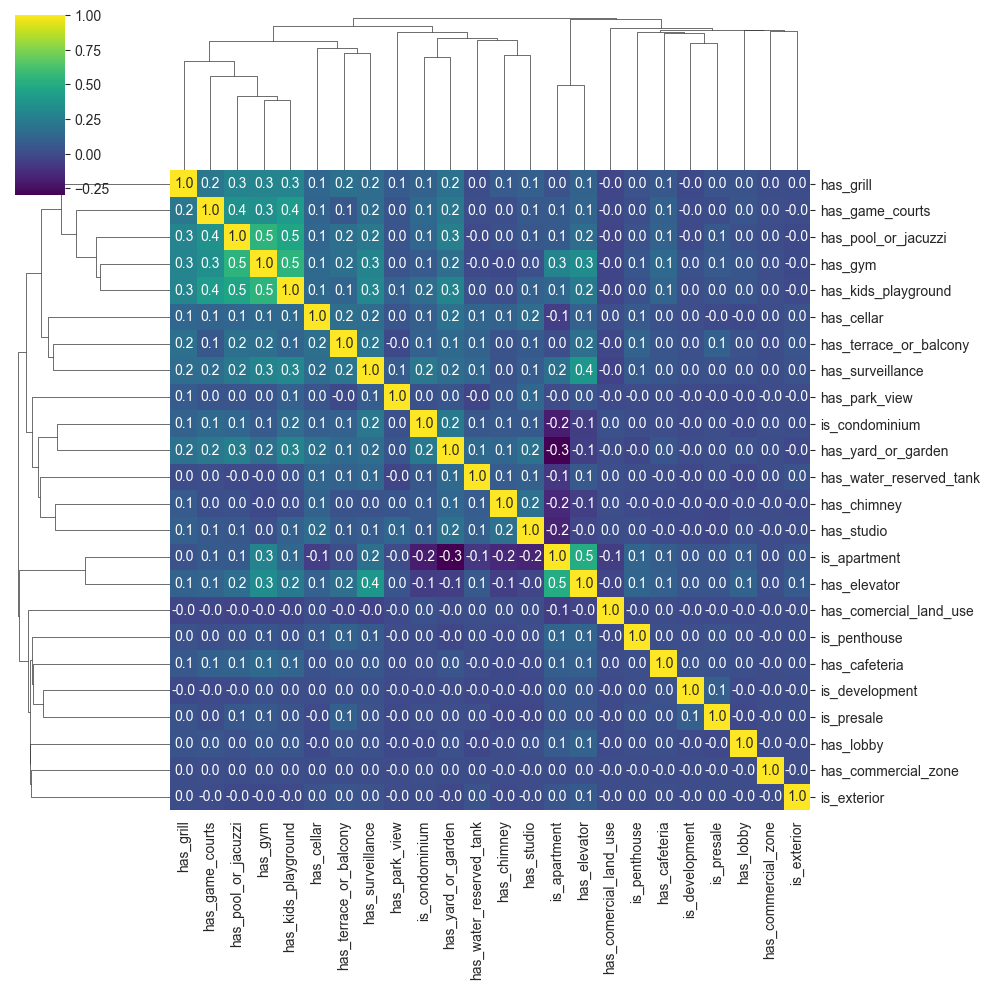

In [ ]:
# get categorical cols
cols_with_has_or_is = [
    col for col in cols_categorical
]
# get rid of category_bedrooms and generic_level and bin_group_*
cols_with_has_or_is.remove('category_bedrooms')
cols_with_has_or_is.remove('generic_level')
cols_with_has_or_is.remove('is_sale')
cols_with_has_or_is = [col for col in cols_with_has_or_is if 'bin_group' not in col]

# compute the correlation matrix using Spearman method
corr_matrix = df_work[cols_with_has_or_is].corr(method='kendall')

# Create a clustermap with one number annotation
plt.figure(figsize=(12, 12))
sns.clustermap(corr_matrix, annot=True, cmap='viridis', fmt=".1f")
plt.show()


# Y vs X's

## WOE

In [ ]:
# generate km plot for each group in group_vars
def plot_km_by_group(df, group):
    df = df.copy()
    ax = plt.subplot(111)

    # iterate over a viridis palette for each unique value
    unique_values = df[group].unique()
    unique_values.sort()
    virids_colors = sns.color_palette('viridis', len(unique_values))

    for i, value in enumerate(unique_values):
        # subset
        df_aux = df[df[group] == value]
        # fit
        kmf = lifelines.KaplanMeierFitter()
        ax = kmf.fit(
            df_aux['time_on_market'],
            df_aux['event'],
            label=value
        ).plot_cumulative_density(
            ci_show=True,
            figsize=(10, 6),
            title='Survival Curve by {}'.format(group),
            color=virids_colors[i]
        )

    # add risk counts
    plt.tight_layout()
    plt.show()
    return

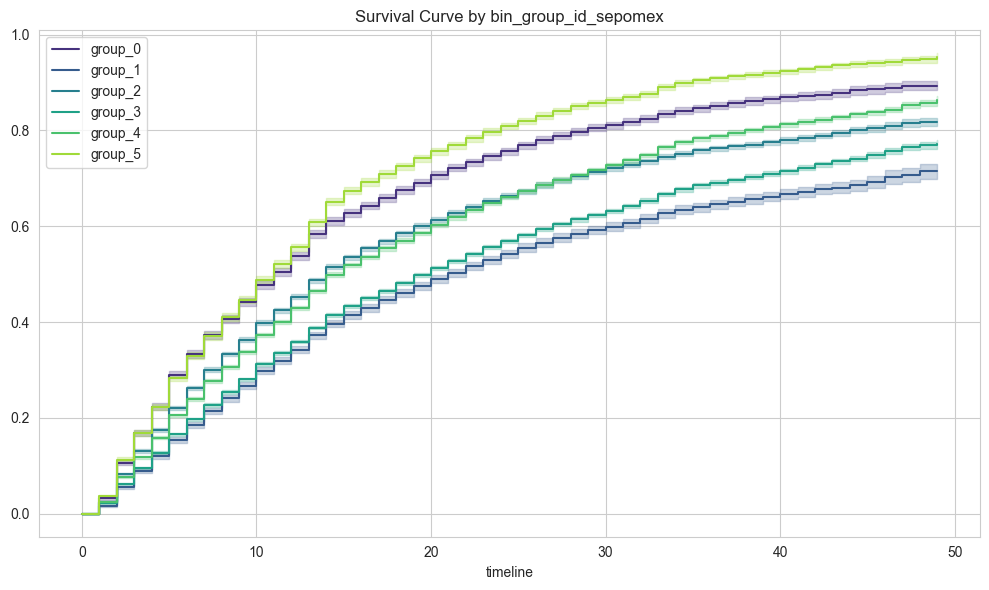

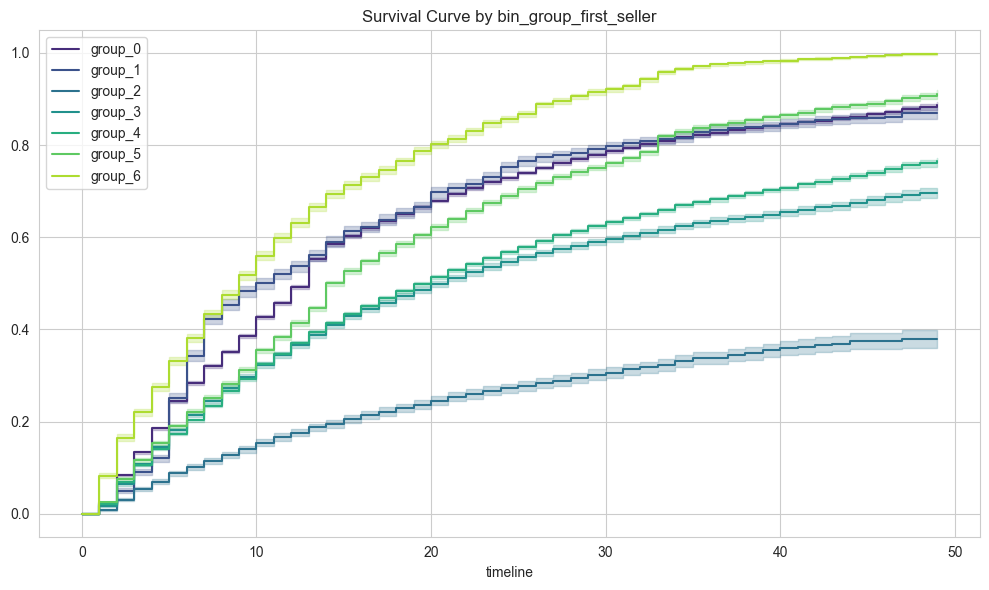

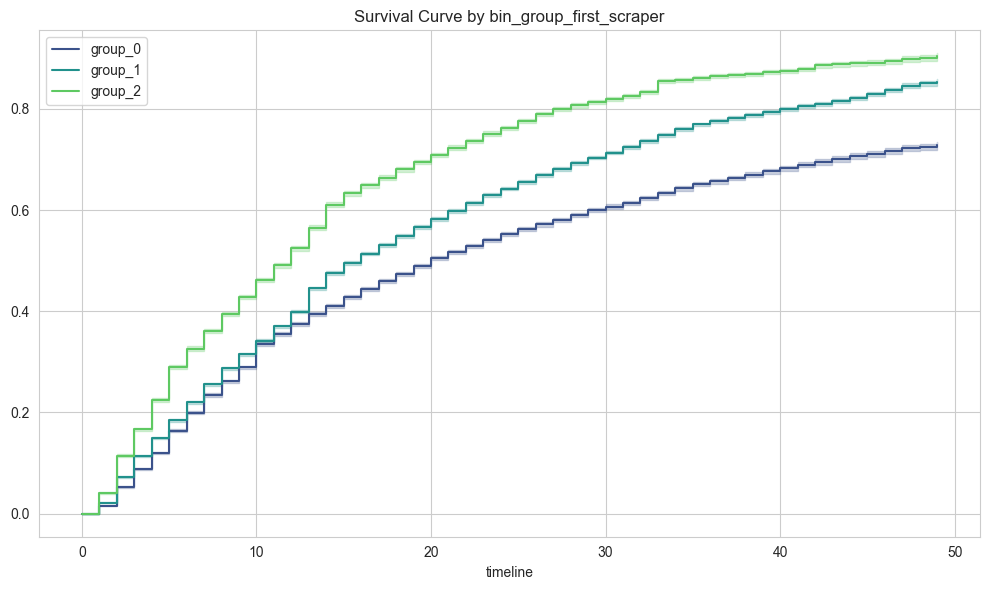

In [ ]:
# plot survival curves by categorical variables
cols2plot = ['bin_group_id_sepomex', 'bin_group_first_seller', 'bin_group_first_scraper']

for col in cols2plot:
    plot_km_by_group(df_work, col)

## Categorical

### plots

In [ ]:
cols2plot

['bin_group_id_sepomex', 'bin_group_first_seller', 'bin_group_first_scraper']

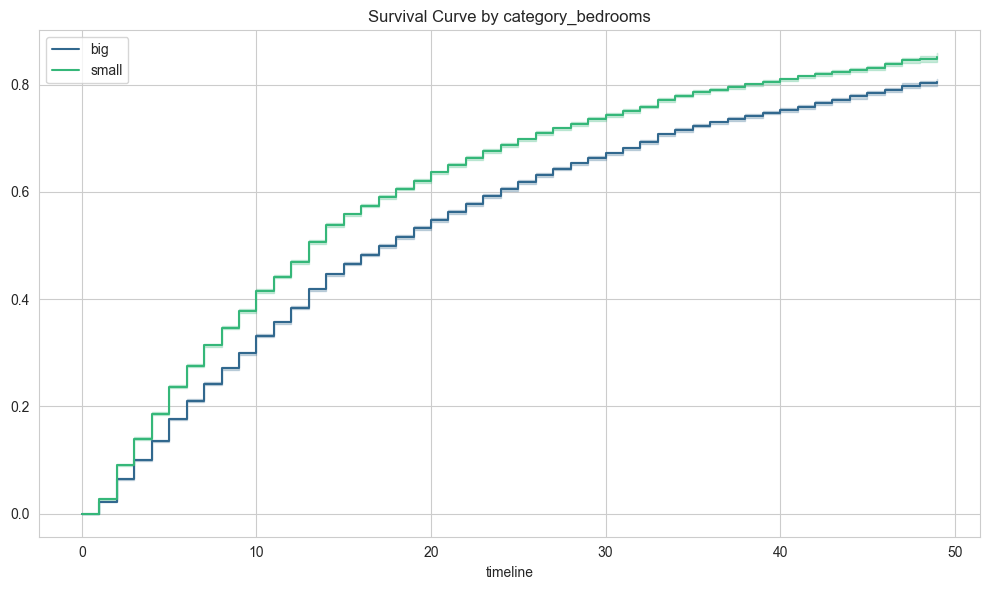

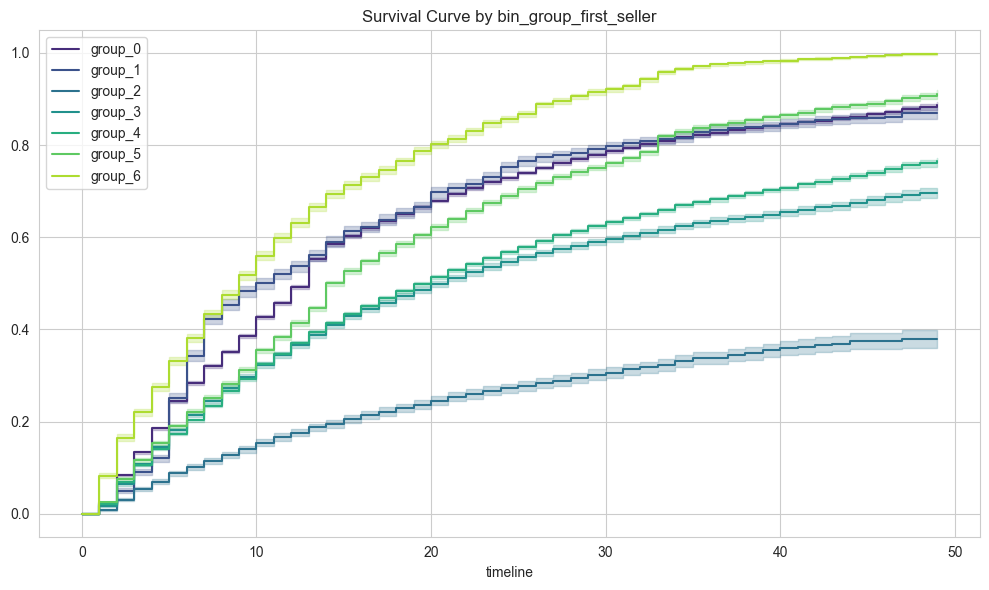

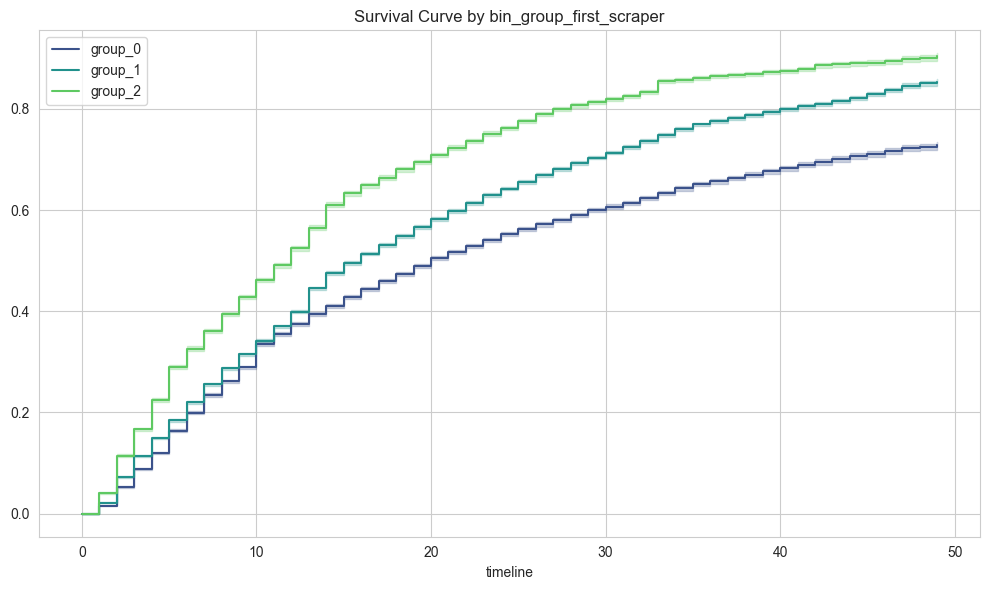

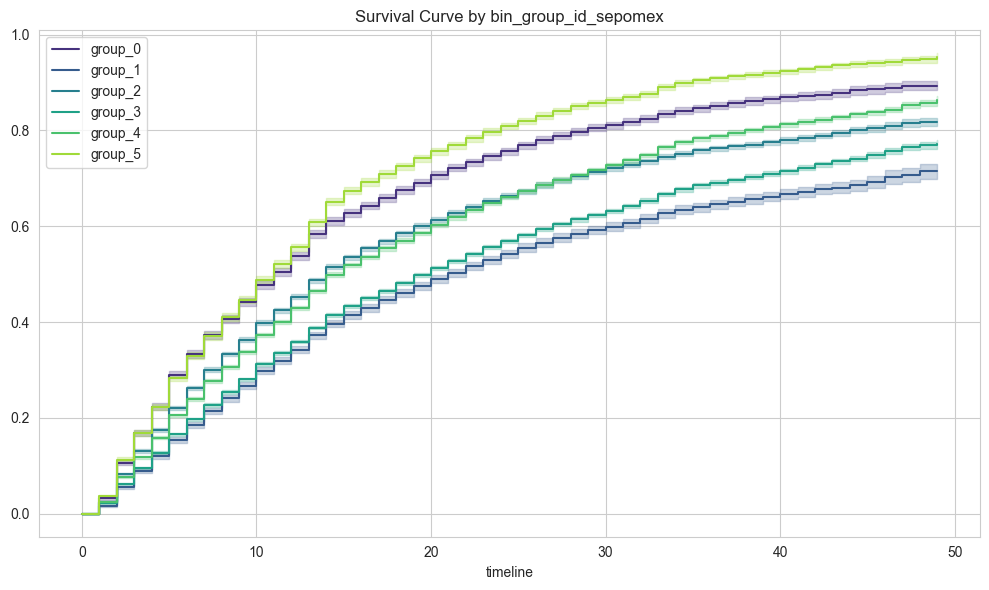

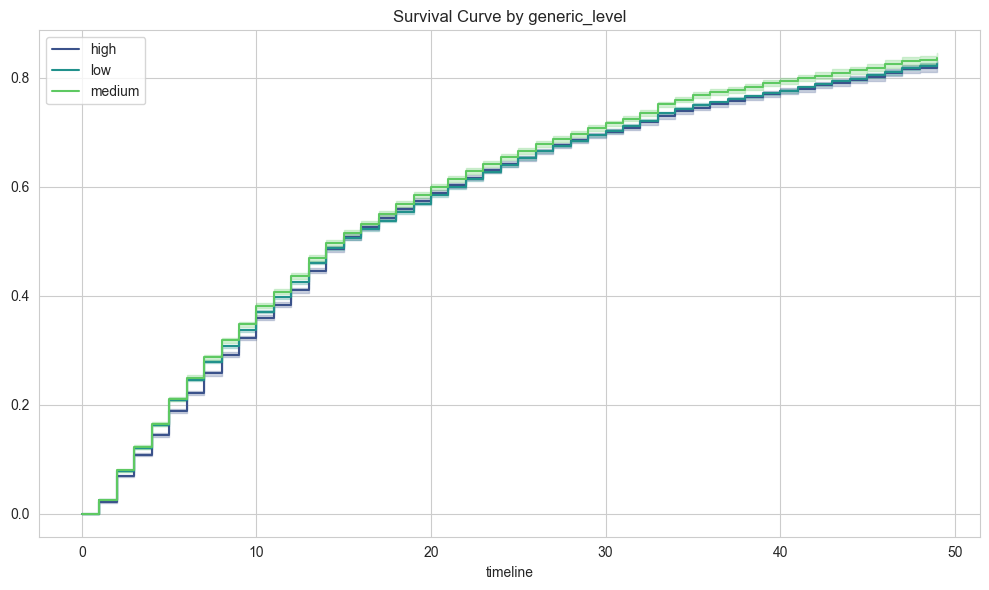

...

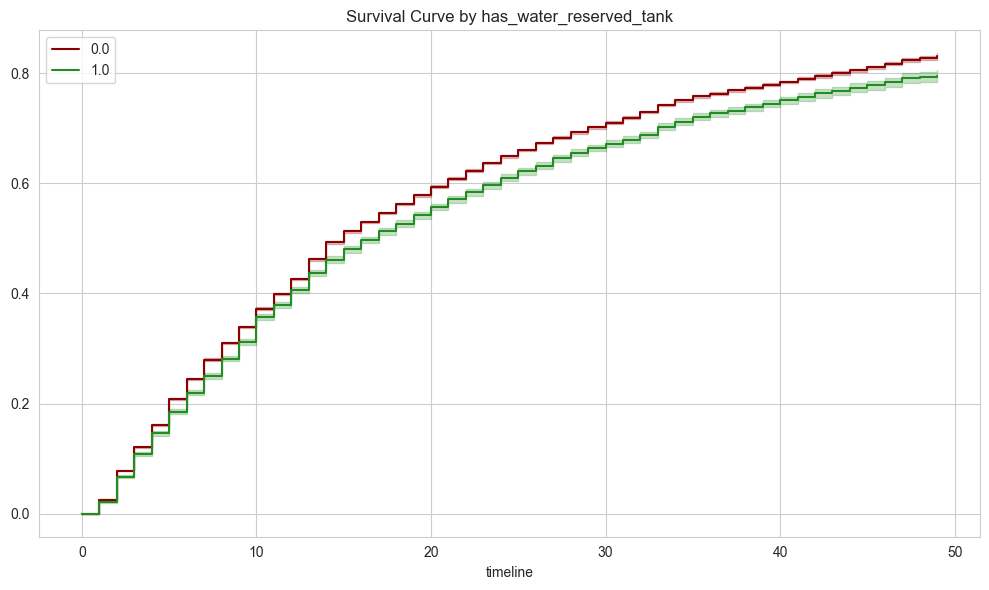

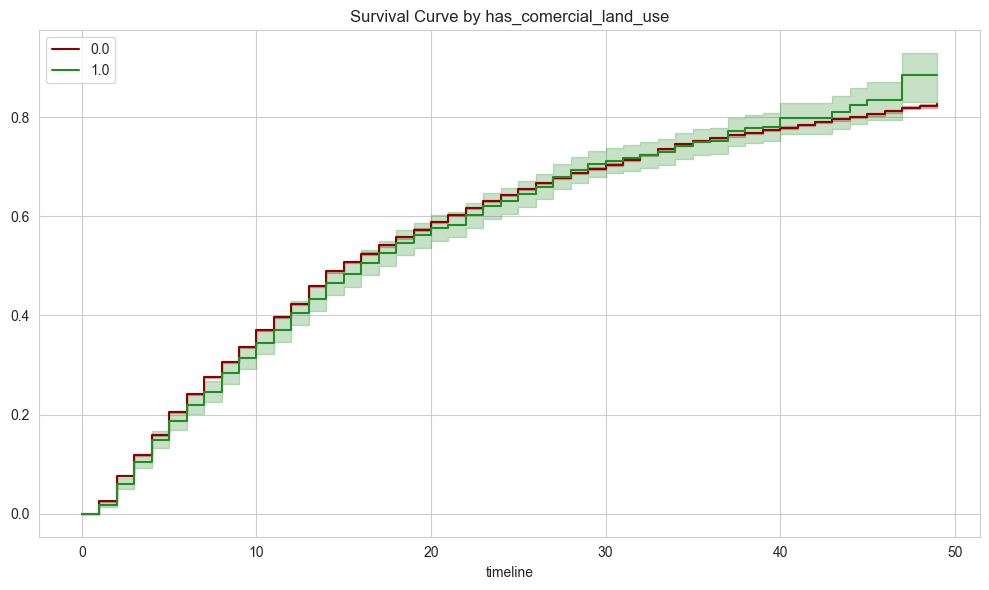

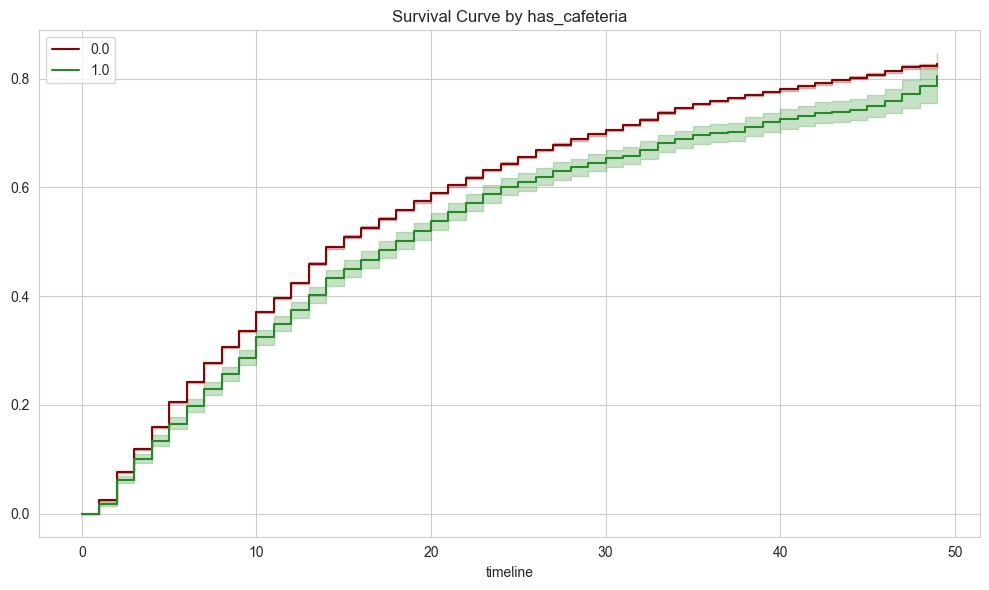

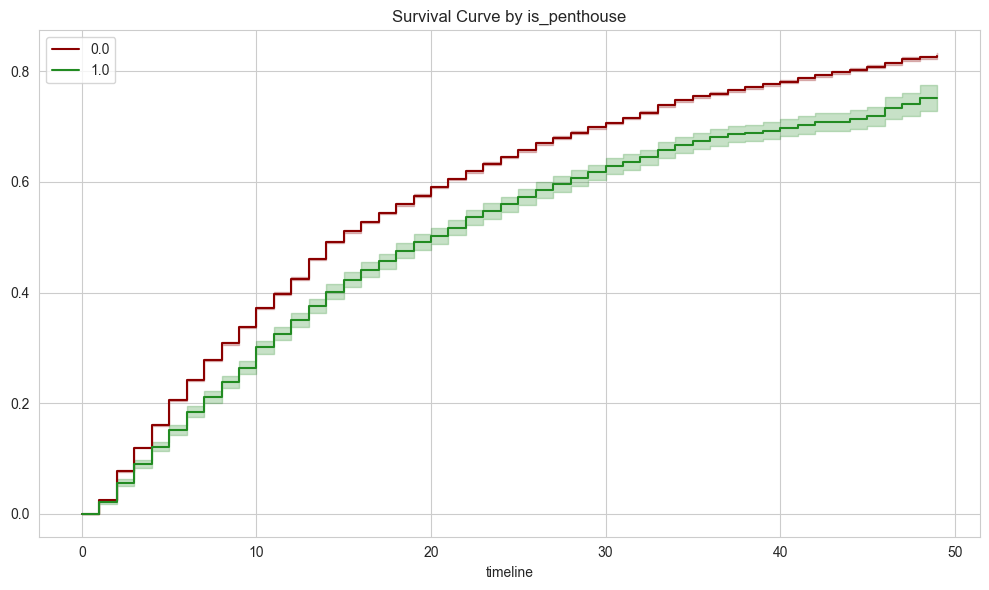

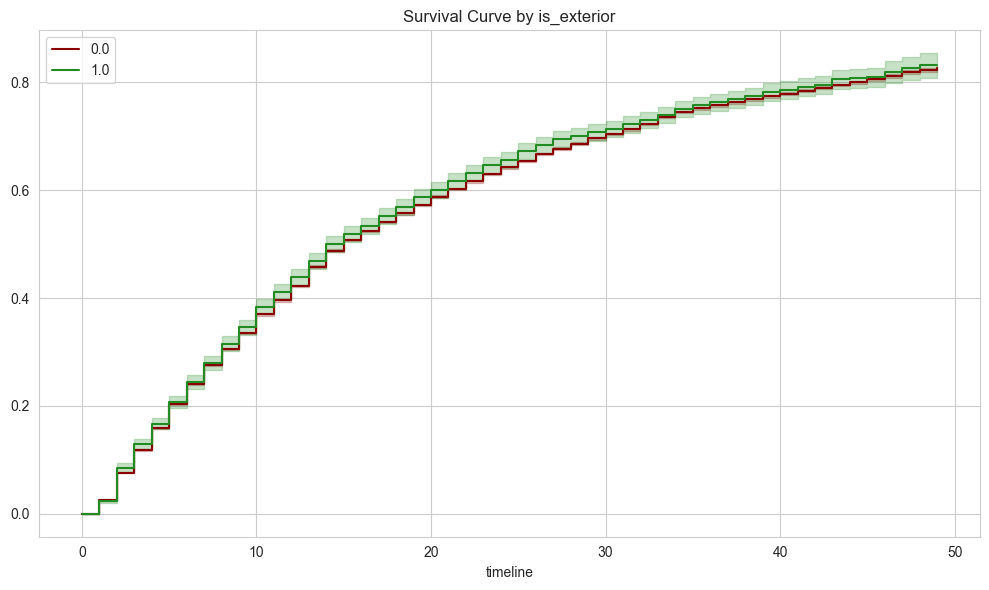

In [ ]:
# plot categorical variables
cols2plot = [
    col for col in cols_categorical
]

# pop 'is_new_property_prob'
cols2plot.remove('is_sale')

# generate km plot for each group in group_vars
def plot_km_by_group(df, group):
    df = df.copy()
    ax = plt.subplot(111)

    # iterate over a viridis palette for each unique value
    unique_values = df[group].unique()
    unique_values.sort()

    # forest green if yes, dar red if not
    if 'has' in group or 'is' in group:
        color2plot = np.where(unique_values >= 1, 'forestgreen', 'darkred')
    else:
        color2plot = sns.color_palette('viridis', len(unique_values))

    for i, value in enumerate(unique_values):
        # subset
        df_aux = df[df[group] == value]
        # fit
        kmf = lifelines.KaplanMeierFitter()
        ax = kmf.fit(
            df_aux['time_on_market'],
            df_aux['event'],
            label=value
        ).plot_cumulative_density(
            ci_show=True,
            figsize=(10, 6),
            title='Survival Curve by {}'.format(group),
            color=color2plot[i]
        )

    # add risk counts
    plt.tight_layout()
    plt.show()
    return

for col in cols2plot:
    plot_km_by_group(df_work, col)

### Proportion between groups

In [ ]:
# coxph for is_exterior
cph = lifelines.CoxPHFitter()
cph.fit(df_work[['is_exterior', 'time_on_market', 'event']], duration_col='time_on_market', event_col='event')

# see coefs
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 204242 total observations, 76907 right-censored observations>
             duration col = 'time_on_market'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 204242
number of events observed = 127335
   partial log-likelihood = -1467838.62
         time fit was run = 2024-02-18 01:10:27 UTC

---
              coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                           
is_exterior   0.03       1.03       0.02            -0.00             0.07                 1.00                 1.07

              cmp to    z    p   -log2(p)
covariate                                
is_exterior     0.00 1.81 0.07       3.84
---
Concordance = 0.50
Partial AIC = 2935679.24
log-likelihood ratio test = 3.25 on 1 df
-log2(p) of ll-ratio test = 3.81

## Numerical

In [ ]:
# generate a scatter plot + loess for each group + event
def plot_scatter_loess(df, xvar, log_scale=False):
    df = df.copy()
    # loess plot, facet grid by listing_type
    sns.lmplot(x=xvar, y="time_on_market", data=df,
               ci=None, logx=log_scale, hue='event',
               scatter_kws={"s": 10, "alpha": 0.5})

    # log x scale if log_scale=True
    plt.xscale('log' if log_scale else 'linear')

    # title
    plt.title(f"Scatter Plot {xvar}")

    return

/Users/ravj/opt/anaconda3/envs/dlsurv/lib/python3.9/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


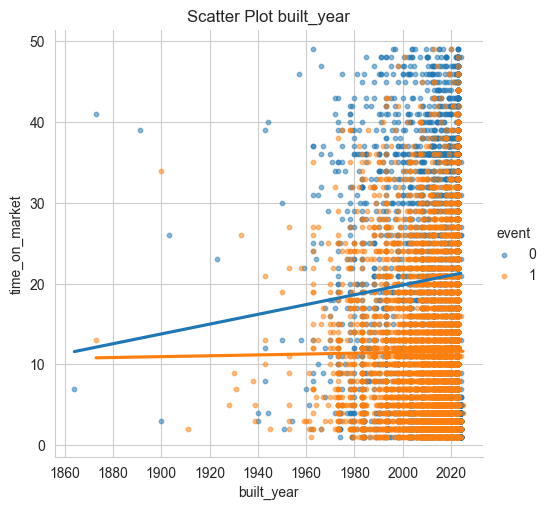

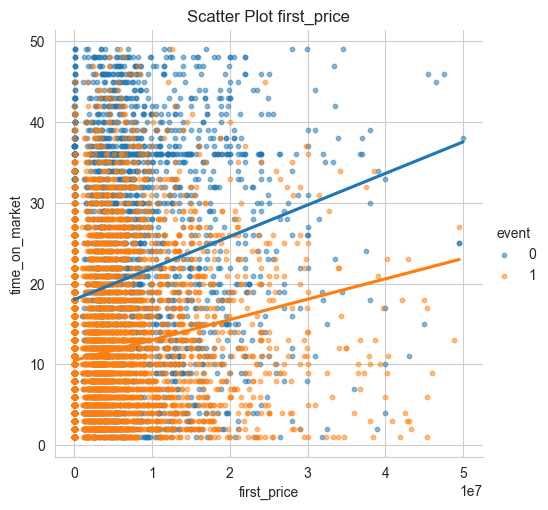

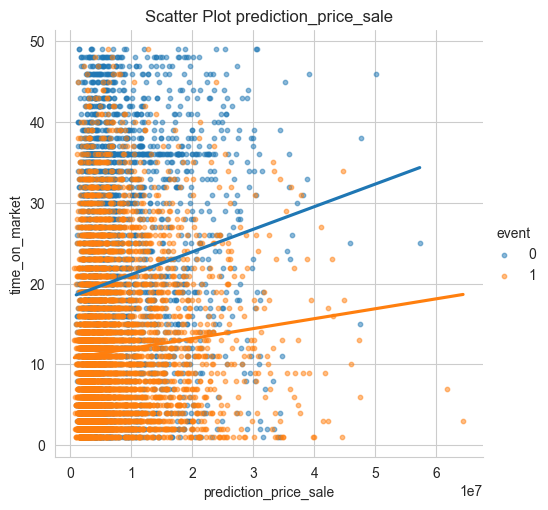

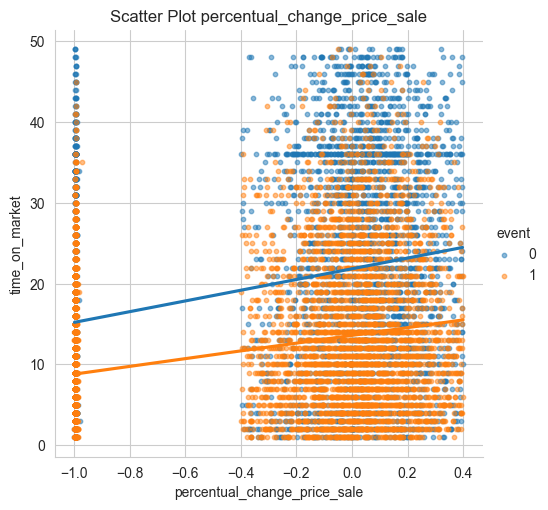

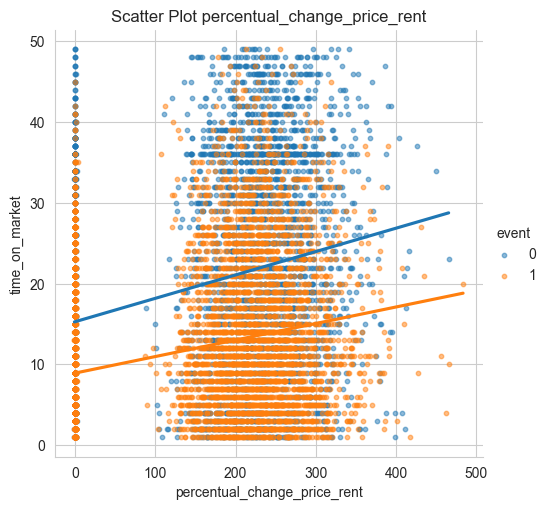

...

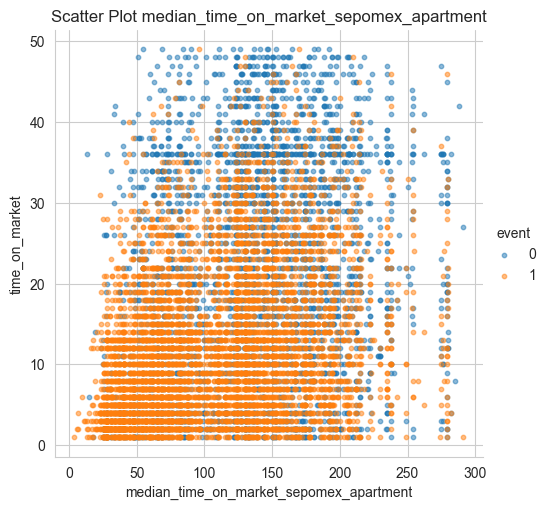

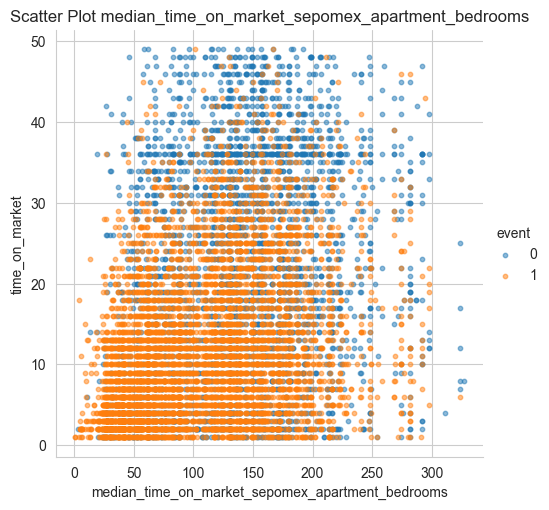

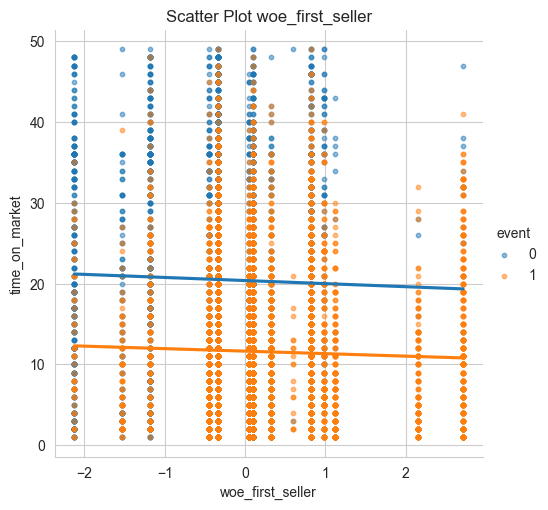

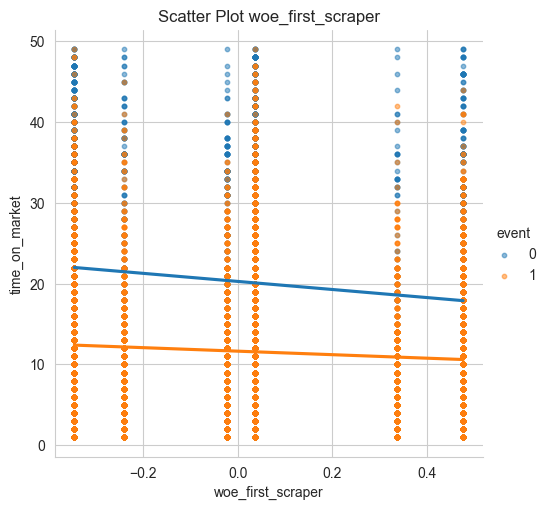

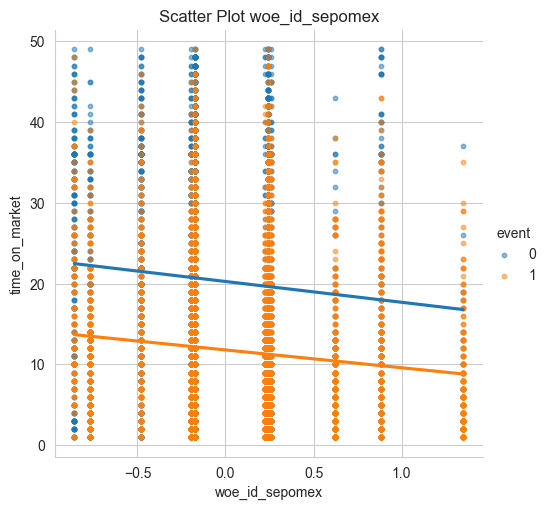

In [ ]:
# print scatter plot for each numeric variable
df_plot = df_work.sample(10000, random_state=8)
for col in cols_numeric:
    plot_scatter_loess(df_plot, col)

## Corrs

In [ ]:
# woe
df_work[['time_on_market'] + [col for col in df_work.columns if col.startswith('woe')]].corr(method='kendall')['time_on_market']

time_on_market       1.000000
woe_first_seller    -0.078735
woe_id_sepomex      -0.077986
woe_first_scraper   -0.065515
Name: time_on_market, dtype: float64

In [ ]:
# categorical
df_work[['time_on_market'] + cols_with_has_or_is].corr(method='kendall')['time_on_market'].sort_values(ascending=False, key=lambda x: np.abs(x))

time_on_market             1.000000
has_terrace_or_balcony     0.073756
has_pool_or_jacuzzi        0.068606
is_presale                 0.064942
has_yard_or_garden         0.058587
has_cellar                 0.057830
has_gym                    0.053577
is_apartment              -0.036617
has_grill                  0.036306
is_development             0.033059
has_kids_playground        0.032972
has_lobby                 -0.031865
has_surveillance           0.031125
has_game_courts            0.030934
is_condominium             0.026011
is_penthouse               0.024544
has_park_view             -0.023999
has_chimney                0.021094
has_elevator               0.016995
has_water_reserved_tank    0.016981
has_cafeteria              0.012570
has_studio                -0.006506
is_exterior               -0.004767
has_commercial_zone        0.002317
has_comercial_land_use     0.001372
Name: time_on_market, dtype: float64

In [ ]:
# numeric
df_work[['time_on_market'] + cols_numeric].corr(method='kendall')['time_on_market'].sort_values(ascending=False, key=lambda x: np.abs(x))

time_on_market                                      1.000000
median_time_on_market_sepomex_apartment_bedrooms    0.241992
median_time_on_market_sepomex_apartment             0.238224
median_time_on_market_sepomex                       0.232167
first_price                                         0.224210
percentual_change_price_rent                        0.212468
theoretical_percentile_mun_comps                    0.210839
percentual_change_price_sale                        0.202398
theoretical_percentile_sepomex_comps                0.189831
num_bathrooms                                       0.111110
prediction_price_sale                               0.100936
built_surface                                       0.096841
num_parking_lots                                    0.094722
total_surface                                       0.092185
num_outdoor_spaces                                  0.084630
woe_first_seller                                   -0.078735
woe_id_sepomex          